<h1><center>Multi-Cancer Identification and Segmentation</center></h1>

<h2><center>Proposed System Architecture</center></h2>


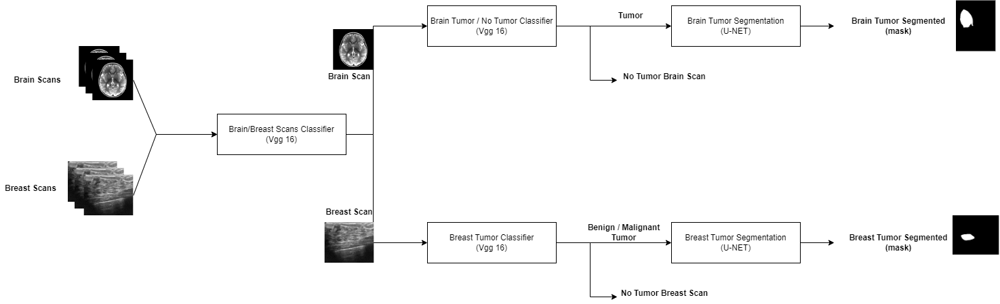

In [ ]:
%%capture
!pip install natsort

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, concatenate, Conv2DTranspose, UpSampling2D, Dropout
from keras.layers import multiply, Lambda, add, Activation
from keras.layers import Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.utils import plot_model
from tensorflow.keras.metrics import Precision, Recall
from keras.models import Sequential
from keras.layers import Flatten, Dense, Dropout
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, precision_score, recall_score, f1_score, classification_report
from tensorflow.keras.callbacks import ModelCheckpoint

import keras.utils as image
from sklearn.utils import shuffle
from keras.optimizers import *
from keras.callbacks import EarlyStopping
import keras.utils as image

import os
from tqdm import tqdm
import natsort
import shutil
import random

import warnings
warnings.filterwarnings('ignore')





from IPython.display import Image, clear_output
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.utils.vis_utils import plot_model
from keras.utils import to_categorical
from keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array,save_img

# Brain/Breast Scans Classifier

## Reading Data

In [ ]:
def prep_data_brain(path, split_type):
    images = []
    labels = []
    for label in ['No tumor', 'Tumor']:
        label_path = os.path.join(path, label, split_type)
        if label == 'Tumor' and split_type in ['Train', 'Test']:
            label_path = os.path.join(path, label, split_type.upper())
        
        for file in os.listdir(label_path):
            image = cv2.imread(os.path.join(label_path, file))
            image = cv2.resize(image, (128, 128))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            images.append(image)
            labels.append(0)
    return np.array(images), np.array(labels)

In [ ]:
def prep_data_breast(path, split_type):
    images = []
    labels = []
    
    for label in ['benign', 'malignant', 'normal']:
        label_path = os.path.join(path, label, split_type)
        for file in os.listdir(label_path):
            if "_mask" not in file:
                image_path = os.path.join(label_path, file)
                image = cv2.imread(image_path)
                image = cv2.resize(image, (128, 128))
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                images.append(image)
                labels.append(1)
    return np.array(images), np.array(labels)

In [ ]:
X_train_brain, y_train_brain = prep_data_brain('/content/Dataset/Brain scans', 'Train')
X_test_brain, y_test_brain = prep_data_brain('/content/Dataset/Brain scans', 'Test')

In [ ]:
X_train_breast, y_train_breast = prep_data_breast('/content/Dataset/Breast scans', 'Train')
X_test_breast, y_test_breast = prep_data_breast('/content/Dataset/Breast scans', 'Test')

In [ ]:
X_train = np.concatenate((X_train_brain, X_train_breast))
y_train = np.concatenate((y_train_brain, y_train_breast))
X_test = np.concatenate((X_test_brain, X_test_breast))
y_test = np.concatenate((y_test_brain, y_test_breast))

print("X_train shape :", X_train.shape)
print("y_train shape :", y_train.shape)
print("X_test shape :", X_test.shape)
print("y_test shape :", y_test.shape)

X_train shape : (1682, 128, 128, 3)
y_train shape : (1682,)
X_test shape : (299, 128, 128, 3)
y_test shape : (299,)


In [ ]:
from sklearn.utils import shuffle
X_train, y_train = shuffle(X_train, y_train, random_state=42)
X_test, y_test = shuffle(X_test, y_test, random_state=42)

## Data Visualization

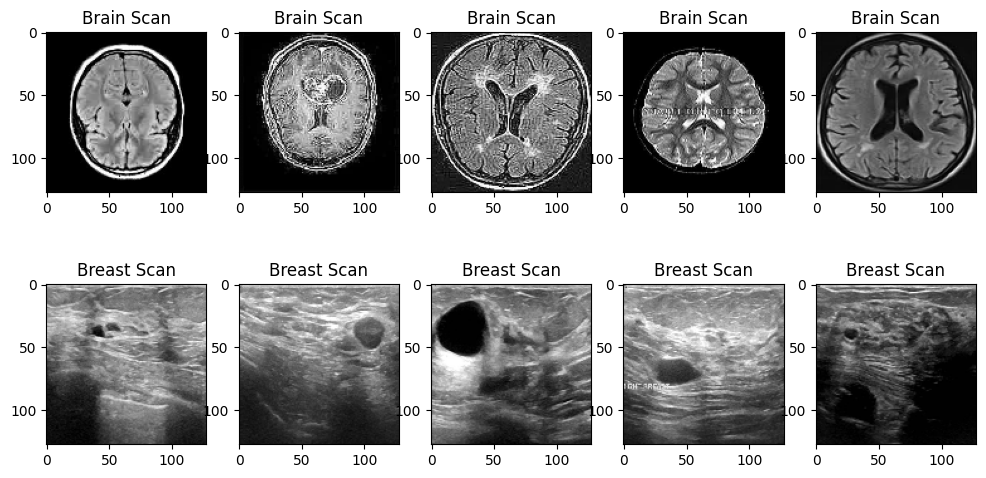

In [ ]:
classes = ['Brain Scan', 'Breast Scan']
# Define the grid size and total number of images to display
num_rows = 2
num_cols = 5
num_images = num_rows * num_cols // 2

# Select num_images random indices from X_train for each label
random_indices_label0 = random.sample(list(np.where(y_train == 0)[0]), num_images)
random_indices_label1 = random.sample(list(np.where(y_train == 1)[0]), num_images)

# Create the matplotlib figure and axes objects
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6))

# Loop through the axes and images for each row, and set the title for each image
for i, random_indices in enumerate([random_indices_label0, random_indices_label1]):
    for j, ax in enumerate(axes[i]):
        image_index = random_indices[j]
        image = X_train[image_index]
        label = y_train[image_index]
        ax.imshow(image)
        ax.set_title(f"{classes[label]}")

# Display the figure
plt.show()

## Modelling

In [ ]:
def plot_history(history):
    # Get the training and validation loss and accuracy values from the history object
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the training and validation loss curves
    ax1.plot(train_loss, label='Training Loss')
    ax1.plot(val_loss, label='Validation Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Training and Validation Loss Curves')
    ax1.legend()

    # Plot the training and validation accuracy curves
    ax2.plot(train_acc, label='Training Accuracy')
    ax2.plot(val_acc, label='Validation Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Training and Validation Accuracy Curves')
    ax2.legend()

    # Display the plots
    plt.show()

def evaluate_model(model, actual_labels, test_images):
    y_pred = model.predict(test_images)
    y_pred = np.where(y_pred > 0.5, 1, 0)
    
    network_metrics = model.evaluate(test_images, actual_labels)
    loss = network_metrics[0]
    accuracy = network_metrics[1]
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    # Calculate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Print the evaluation metrics
    print(f'Test Loss: {loss:.4f}')
    print(f'Test Accuracy: {accuracy:.4f}')
    print(f'Test Precision: {precision:.4f}')
    print(f'Test Recall: {recall:.4f}')
    print(f'Test F1 Score: {f1:.4f}')
    
    # Print the classification report
    print('Classification report:')
    print(classification_report(y_test, y_pred))
    
    # Plot the confusion matrix using seaborn
    sns.heatmap(cm, annot=True, cmap='coolwarm', fmt='g')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest') 
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow(
    x=X_train,
    y=y_train,
    batch_size=32,
    shuffle=True,
)

test_generator = test_datagen.flow(
    x=X_test,
    y=y_test,
    batch_size=32,
    shuffle=False,
)

In [ ]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(128,128,3))


for layer in base_model.layers:
    layer.trainable = False

58889256/58889256 [==============================] - 4s 0us/step


In [ ]:
model = Sequential()
model.add(base_model)
model.add(Flatten(name='Flatten'))
model.add(Dense(256, activation='relu', name='Dense_1'))
model.add(Dropout(0.2, name='Dropout'))
model.add(Dense(1, activation='sigmoid', name='Output'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(train_generator, epochs=5, validation_data = test_generator)

Epoch 1/5
53/53 [==============================] - 18s 311ms/step - loss: 0.0261 - accuracy: 0.9851 - val_loss: 1.6121e-07 - val_accuracy: 1.0000
Epoch 2/5
53/53 [==============================] - 10s 191ms/step - loss: 1.4918e-05 - accuracy: 1.0000 - val_loss: 5.9242e-10 - val_accuracy: 1.0000
Epoch 3/5
53/53 [==============================] - 8s 151ms/step - loss: 0.0012 - accuracy: 0.9994 - val_loss: 1.5087e-06 - val_accuracy: 1.0000
Epoch 4/5
53/53 [==============================] - 13s 237ms/step - loss: 4.1010e-04 - accuracy: 1.0000 - val_loss: 1.9497e-10 - val_accuracy: 1.0000
Epoch 5/5
53/53 [==============================] - 11s 203ms/step - loss: 4.9481e-07 - accuracy: 1.0000 - val_loss: 2.0020e-10 - val_accuracy: 1.0000


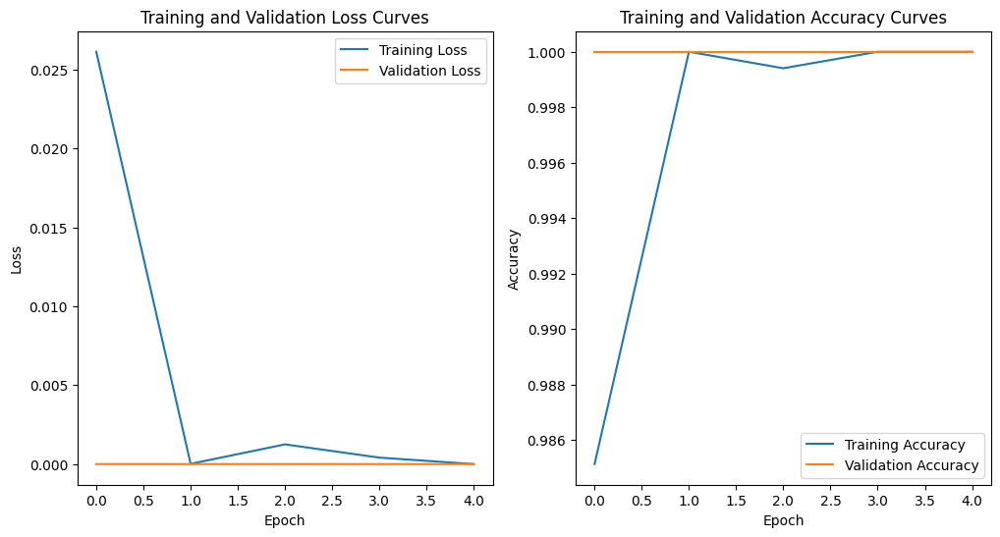

In [ ]:
plot_history(history)

10/10 [==============================] - 1s 43ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Test Loss: 0.0000
Test Accuracy: 1.0000
Test Precision: 1.0000
Test Recall: 1.0000
Test F1 Score: 1.0000
Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       200
           1       1.00      1.00      1.00        99

    accuracy                           1.00       299
   macro avg       1.00      1.00      1.00       299
weighted avg       1.00      1.00      1.00       299



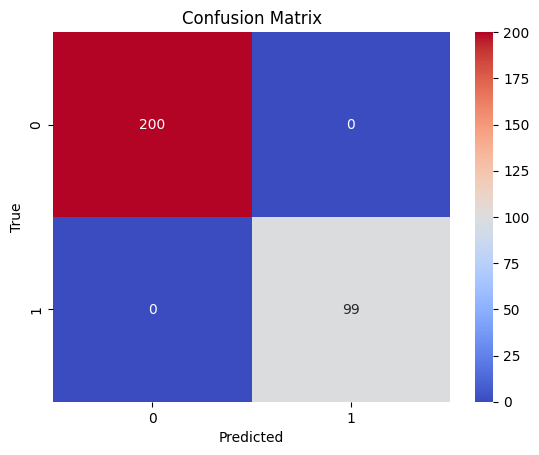

In [ ]:
evaluate_model(model, y_test, X_test)

In [ ]:
model.save("Brain_Breast_Classifier.h5")

## Visualizing Results

10/10 [==============================] - 0s 47ms/step


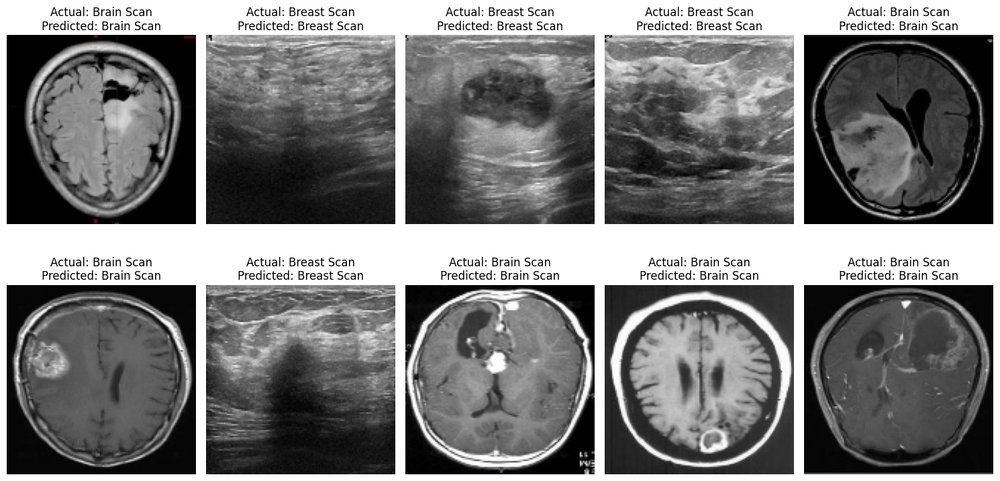

In [ ]:
y_pred = model.predict(X_test)
y_pred = np.where(y_pred > 0.5, 1, 0)

# Define a list of class labels
class_labels = ['Brain Scan', 'Breast Scan']

# Create a 5x2 grid of images and plot the images with their actual and predicted labels
fig, axes = plt.subplots(2, 5, figsize=(15, 8))
for i, ax in enumerate(axes.flat):
    # Get a random test image and its label
    idx = np.random.randint(0, len(X_test))
    image = X_test[idx]
    label = class_labels[int(y_test[idx])]
    
    # Get the predicted label
    pred_label = class_labels[int(y_pred[idx])]
    
    # Plot the image and label as the title
    ax.imshow(image)
    ax.set_title('Actual: {}\nPredicted: {}'.format(label, pred_label))
    ax.axis('off')
    
plt.tight_layout()
plt.show()

# Brain Tumor Classifier

## Reading Data

In [ ]:
def change_dir(source_directory,destination_directory):
    
  if not os.path.exists(destination_directory):
      os.makedirs(destination_directory)

  # Define the ImageDataGenerator object
  datagen = ImageDataGenerator()

  # Get the list of image files in the source directory
  image_files = [os.path.join(source_directory, f) for f in os.listdir(source_directory) if f.endswith(".jpg")]

  # Get the number of images in the directory
  num_images = len(image_files)

  # Loop through the image files and store the images in the array
  for i, image_file in enumerate(image_files):
      img = load_img(image_file, target_size=(128, 128))
      img_array = img_to_array(img)
      img_array = np.expand_dims(img_array, axis=0)
      img_array = datagen.standardize(img_array)
      
      # Save the processed image to the destination directory
      filename = os.path.basename(image_file)
      destination_path = os.path.join(destination_directory, filename)
      save_img(destination_path, img_array[0])

In [ ]:
source_directory1 = '/content/Dataset/Brain scans/No tumor/Test'
destination_directory1 = '/content/Dataset/Brain scans/Classifier/Test/no tumor'
  
source_directory2 = '/content/Dataset/Brain scans/Tumor/TEST'
destination_directory2 = '/content/Dataset/Brain scans/Classifier/Test/tumor'

source_directory3 = '/content/Dataset/Brain scans/Tumor/TRAIN'
destination_directory3 = '/content/Dataset/Brain scans/Classifier/Train/tumor'

source_directory4 = '/content/Dataset/Brain scans/No tumor/Train'
destination_directory4 = '/content/Dataset/Brain scans/Classifier/Train/no tumor'

change_dir(source_directory1, destination_directory1)
change_dir(source_directory2, destination_directory2)
change_dir(source_directory3, destination_directory3)
change_dir(source_directory4, destination_directory4)

## Data Visualiztion

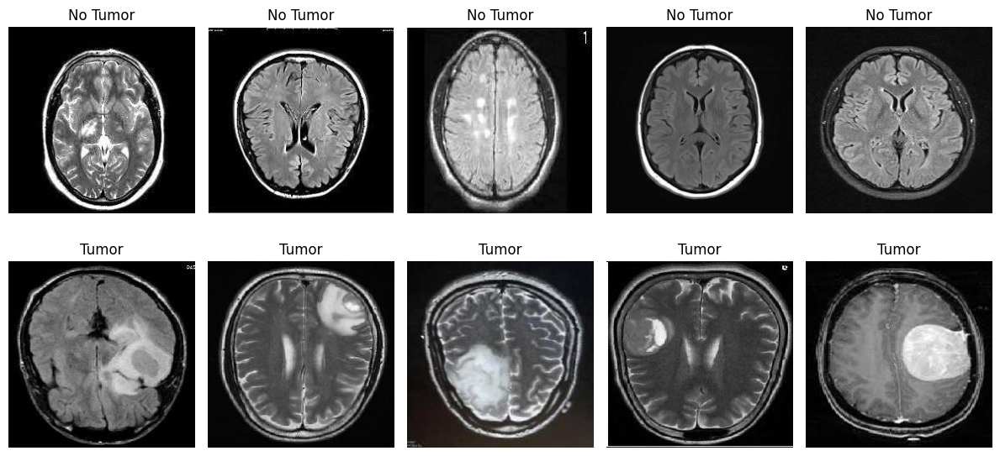

In [ ]:
# Define the paths to the two folders
no_tumor_path = '/content/Dataset/Brain scans/Classifier/Test/no tumor'
tumor_path = '/content/Dataset/Brain scans/Classifier/Test/tumor'

# Load 5 random images from each folder
no_tumor_images = random.sample(os.listdir(no_tumor_path), 5)
tumor_images = random.sample(os.listdir(tumor_path), 5)

# Create a 2x5 grid of subplots and plot the images with titles
fig, axes = plt.subplots(2, 5, figsize=(12, 6))
for i, image_path in enumerate(no_tumor_images):
    image = plt.imread(os.path.join(no_tumor_path, image_path))
    ax = axes[0, i]
    ax.imshow(image)
    ax.set_title('No Tumor')
    ax.axis('off')
for i, image_path in enumerate(tumor_images):
    image = plt.imread(os.path.join(tumor_path, image_path))
    ax = axes[1, i]
    ax.imshow(image)
    ax.set_title('Tumor')
    ax.axis('off')

plt.tight_layout()
plt.show()

## Modelling

In [ ]:
def plot_history(history):
    # Get the training and validation loss and accuracy values from the history object
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the training and validation loss curves
    ax1.plot(train_loss, label='Training Loss')
    ax1.plot(val_loss, label='Validation Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Training and Validation Loss Curves')
    ax1.legend()

    # Plot the training and validation accuracy curves
    ax2.plot(train_acc, label='Training Accuracy')
    ax2.plot(val_acc, label='Validation Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Training and Validation Accuracy Curves')
    ax2.legend()

    # Display the plots
    plt.show()

In [ ]:
# Orignal Code
# Set up data generators for training and testing
test_datagen = ImageDataGenerator(rescale=1./255)

# Define image size
img_size = (128, 128)

# Create data generator for training set
train_datagen1 = ImageDataGenerator(rescale=1./255
                                    ,rotation_range=20,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2, 
                                   shear_range=0.2, 
                                   zoom_range=0.2, 
                                  fill_mode="nearest",
                                   horizontal_flip=True)


train_generator1 = train_datagen1.flow_from_directory('/content/Dataset/Brain scans/Classifier/Train',
                                                    target_size=img_size,
                                                    batch_size=32,
                                                    class_mode='binary')

# Create data generator for testing set
test_generator = test_datagen.flow_from_directory('/content/Dataset/Brain scans/Classifier/Test',
                                                  target_size=img_size,
                                                  batch_size=32,
                                                  class_mode='binary')

In [ ]:
# Load pre-trained VGG16 model
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze convolutional layers
for layer in vgg16.layers:
    layer.trainable = False

In [ ]:
# Build classification model
model = Sequential()
model.add(vgg16)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy', Precision(name='precision'), Recall(name='recall')])

In [ ]:
# Train model
model_history1=model.fit(train_generator1, epochs=20, validation_data=test_generator)

Epoch 1/20
32/32 [==============================] - 8s 219ms/step - loss: 0.6678 - accuracy: 0.7073 - precision: 0.7058 - recall: 0.7100 - val_loss: 0.3341 - val_accuracy: 0.8400 - val_precision: 0.8148 - val_recall: 0.8800
Epoch 2/20
32/32 [==============================] - 5s 170ms/step - loss: 0.3570 - accuracy: 0.8521 - precision: 0.8534 - recall: 0.8500 - val_loss: 0.2954 - val_accuracy: 0.8450 - val_precision: 0.8000 - val_recall: 0.9200
Epoch 3/20
32/32 [==============================] - 7s 206ms/step - loss: 0.3226 - accuracy: 0.8751 - precision: 0.8850 - recall: 0.8620 - val_loss: 0.2813 - val_accuracy: 0.8850 - val_precision: 0.9053 - val_recall: 0.8600
Epoch 4/20
32/32 [==============================] - 5s 164ms/step - loss: 0.3195 - accuracy: 0.8611 - precision: 0.8560 - recall: 0.8680 - val_loss: 0.2752 - val_accuracy: 0.8750 - val_precision: 0.8641 - val_recall: 0.8900
Epoch 5/20
32/32 [==============================] - 5s 166ms/step - loss: 0.2851 - accuracy: 0.8901 - pr

In [ ]:
model.save('brain_classifier.h5')

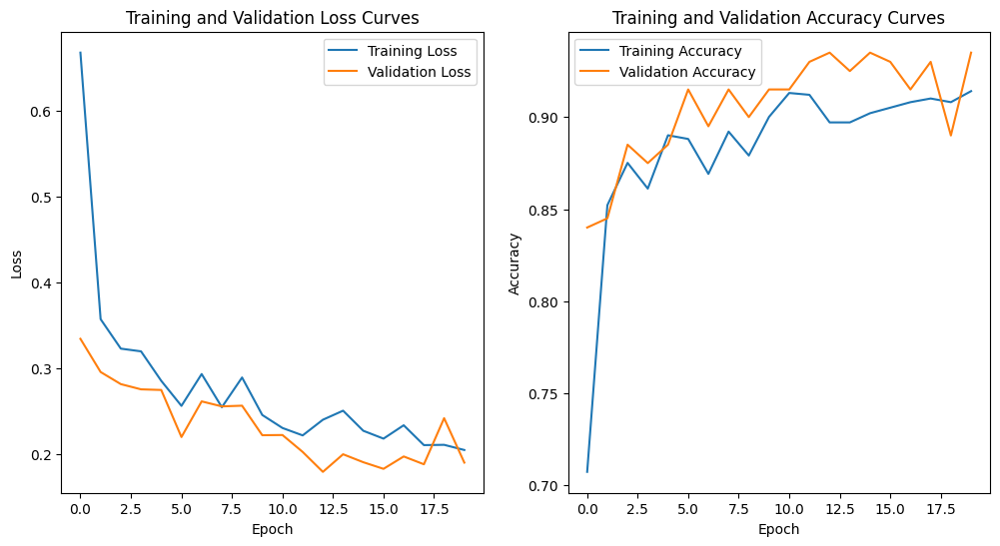

In [ ]:
plot_history(model_history1)

In [ ]:
# Evaluate model
loss, accuracy,precision,recall = model.evaluate(train_generator1, verbose=0)
print('Train loss:', loss)
print('Train accuracy:', accuracy)
print("Train precision: ",precision)
print("Train recall: ",recall)


loss, accuracy,precision,recall = model.evaluate(test_generator,  verbose=0)
print('\nTest loss:', loss)
print('Test accuracy:', accuracy)
print("Test precision: ",precision)
print("Test recall: ",recall)

Train loss: 0.16949103772640228
Train accuracy: 0.9330669045448303
Train precision:  0.9155470132827759
Train recall:  0.9539999961853027

Test loss: 0.18973536789417267
Test accuracy: 0.9350000023841858
Test precision:  0.9306930899620056
Test recall:  0.9399999976158142


## Visualizing Results

1/1 [==============================] - 0s 26ms/step


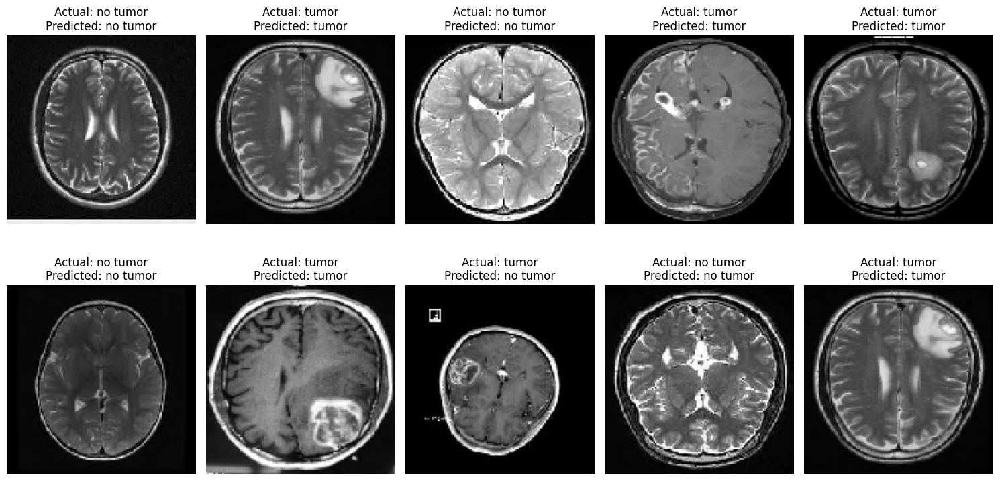

In [ ]:
# Get a batch of test images and labels
X_test, y_test = next(test_generator)

# Make predictions on the test images
y_pred = model.predict(X_test)
y_pred = np.where(y_pred> 0.5, 1, 0).reshape(-1, )

# Define a list of class labels
class_labels = list(test_generator.class_indices.keys())

# Create a 5x2 grid of images and plot the images with their actual and predicted labels
fig, axes = plt.subplots(2, 5, figsize=(15, 8))
for i, ax in enumerate(axes.flat):
    # Get a random test image and its label
    idx = np.random.randint(0, X_test.shape[0])
    image = X_test[idx]
    label = int(y_test[idx])
    
    # Get the predicted label
    pred_label = y_pred[idx]
    
    # Plot the image and label as the title
    ax.imshow(image)
    ax.set_title('Actual: {}\nPredicted: {}'.format(class_labels[label], class_labels[pred_label]))
    ax.axis('off')
    
plt.tight_layout()
plt.show()

# Breast Tumor Classifier

## Reading Data

In [ ]:
def load_data(path):
    x_train_total = []
    y_train_total = []
    x_test_total = []
    y_test_total = []

    for folder in os.listdir(path):
        if not os.path.isdir(os.path.join(path, folder)):
            continue

        train_path = os.path.join(path, folder, "Train")
        test_path = os.path.join(path, folder, "Test")

        for photo in os.listdir(train_path):
          
            if "_mask" not in photo:
                img = cv2.imread(os.path.join(train_path, photo))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (128, 128))
                x_train_total.append(img)
                if "benign" in train_path:    
                    y_train_total.append(2)
                elif "malignant" in train_path:
                    y_train_total.append(1)
                elif "normal" in train_path:    
                    y_train_total.append(0)

        for photo in os.listdir(test_path):
            if "_mask" not in photo:
                img = cv2.imread(os.path.join(test_path, photo))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (128, 128))
                x_test_total.append(img)
                if "benign" in test_path:    
                    y_test_total.append(2)
                elif "malignant" in test_path:
                    y_test_total.append(1)
                elif "normal" in test_path:    
                    y_test_total.append(0)

    X_train = np.array(x_train_total)
    y_train = np.array(y_train_total)
    X_test = np.array(x_test_total)
    y_test = np.array(y_test_total)

    return X_train, X_test, y_train, y_test

In [ ]:
X_train, X_test, y_train, y_test = load_data('/content/Dataset/Breast scans')

In [ ]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (681, 128, 128, 3)
X_test shape: (99, 128, 128, 3)
y_train shape: (681,)
y_test shape: (99,)


In [ ]:
(X_train,y_train) = shuffle(X_train, y_train, random_state=25)
(X_test,y_test) = shuffle(X_test, y_test, random_state=25)

In [ ]:
y_test_copy = y_test.copy()

In [ ]:
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

## Data Visualization

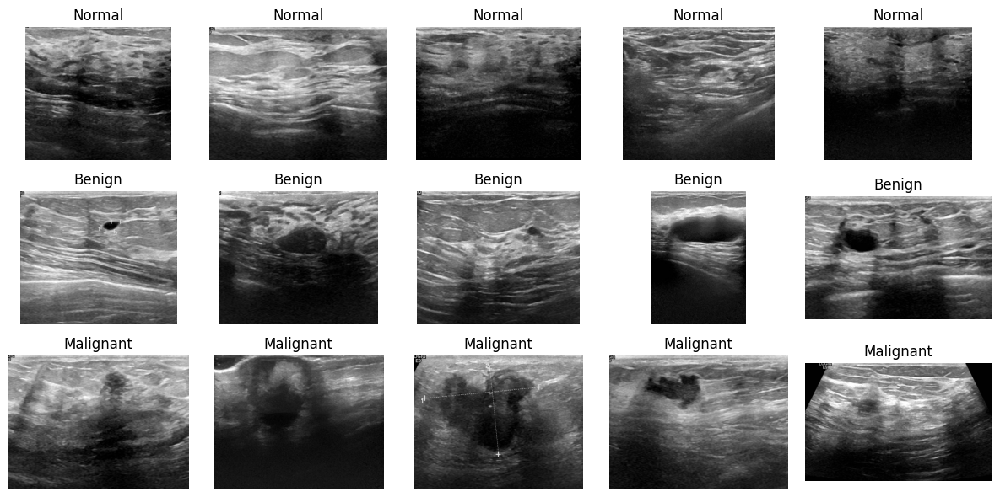

In [ ]:
# Define the paths to the folders
normal_path = '/content/Dataset/Breast scans/normal'
benign_path = '/content/Dataset/Breast scans/benign'
malignant_path = '/content/Dataset/Breast scans/malignant'

# Load 5 random images from the train folder of each directory
normal_images = random.sample([f for f in os.listdir(os.path.join(normal_path, 'Train')) if '_mask' not in f], 5)
benign_images = random.sample([f for f in os.listdir(os.path.join(benign_path, 'Train')) if '_mask' not in f], 5)
malignant_images = random.sample([f for f in os.listdir(os.path.join(malignant_path, 'Train')) if '_mask' not in f], 5)

# Create a 3x5 grid of subplots and plot the images with titles
fig, axes = plt.subplots(3, 5, figsize=(12, 6))
for i, image_path in enumerate(normal_images):
    image = plt.imread(os.path.join(normal_path, 'Train', image_path))
    ax = axes[0, i]
    ax.imshow(image)
    ax.set_title('Normal')
    ax.axis('off')
for i, image_path in enumerate(benign_images):
    image = plt.imread(os.path.join(benign_path, 'Train', image_path))
    ax = axes[1, i]
    ax.imshow(image)
    ax.set_title('Benign')
    ax.axis('off')
for i, image_path in enumerate(malignant_images):
    image = plt.imread(os.path.join(malignant_path, 'Train', image_path))
    ax = axes[2, i]
    ax.imshow(image)
    ax.set_title('Malignant')
    ax.axis('off')

plt.tight_layout()
plt.show()

## Modelling

In [ ]:
def plot_history(history):
    # Get the training and validation loss and accuracy values from the history object
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the training and validation loss curves
    ax1.plot(train_loss, label='Training Loss')
    ax1.plot(val_loss, label='Validation Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Training and Validation Loss Curves')
    ax1.legend()

    # Plot the training and validation accuracy curves
    ax2.plot(train_acc, label='Training Accuracy')
    ax2.plot(val_acc, label='Validation Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Training and Validation Accuracy Curves')
    ax2.legend()

    # Display the plots
    plt.show()


def evaluate_model(model, actual_labels, test_images):
    y_pred = model.predict(test_images)
    y_pred = np.argmax(y_pred, axis=1)
    y_test = np.argmax(actual_labels, axis=1)
    
    network_metrics = model.evaluate(test_images, actual_labels)
    loss = network_metrics[0]
    accuracy = network_metrics[1]
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    # Calculate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Print the evaluation metrics
    print(f'Test Loss: {loss:.4f}')
    print(f'Test Accuracy: {accuracy:.4f}')
    print(f'Test Precision: {precision:.4f}')
    print(f'Test Recall: {recall:.4f}')
    print(f'Test F1 Score: {f1:.4f}')
    
    # Print the classification report
    print('Classification report:')
    print(classification_report(y_test, y_pred))
    
    # Plot the confusion matrix using seaborn
    sns.heatmap(cm, annot=True, cmap='coolwarm', fmt='g')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

In [ ]:
# Define data augmentation transformations
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest')

# Fit the augmentation on your training data
train_datagen.fit(X_train)
train_generator = train_datagen.flow(X_train,y_train, batch_size=32)

In [ ]:
# Define the VGG16 model as the base model
vgg16_base = VGG16(include_top=False, input_shape=(128,128,3))

# Freeze the layers in the base model
for layer in vgg16_base.layers:
    layer.trainable = False

# Add custom top layers to the model
x = Flatten()(vgg16_base.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(3, activation='softmax')(x)

In [ ]:
# Define the final model by combining the base and top layers
model = Model(inputs=vgg16_base.input, outputs=x)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
checkpointer = ModelCheckpoint('Breast_cancer_classification_model.h5', verbose=1, save_best_only=True)

In [ ]:
# Train the model
history = model.fit(train_generator, epochs=50, validation_data=(X_test, y_test),callbacks = [checkpointer])

Epoch 1/50
22/22 [==============================] - ETA: 0s - loss: 7.1296 - accuracy: 0.4699
Epoch 1: val_loss improved from inf to 3.37166, saving model to Breast_cancer_classification_model.h5
22/22 [==============================] - 5s 164ms/step - loss: 7.1296 - accuracy: 0.4699 - val_loss: 3.3717 - val_accuracy: 0.5354
Epoch 2/50
22/22 [==============================] - ETA: 0s - loss: 4.3521 - accuracy: 0.5815
Epoch 2: val_loss improved from 3.37166 to 2.69824, saving model to Breast_cancer_classification_model.h5
22/22 [==============================] - 3s 139ms/step - loss: 4.3521 - accuracy: 0.5815 - val_loss: 2.6982 - val_accuracy: 0.5657
Epoch 3/50
22/22 [==============================] - ETA: 0s - loss: 3.5367 - accuracy: 0.6285
Epoch 3: val_loss improved from 2.69824 to 2.19295, saving model to Breast_cancer_classification_model.h5
22/22 [==============================] - 3s 132ms/step - loss: 3.5367 - accuracy: 0.6285 - val_loss: 2.1929 - val_accuracy: 0.6061
Epoch 4/50


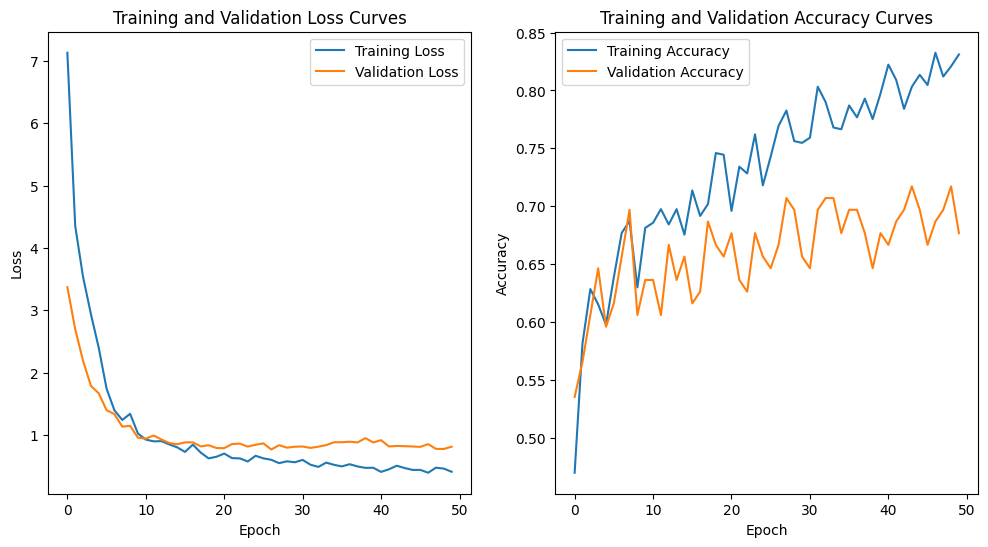

In [ ]:
# Plot the training and validation curves
plot_history(history)

4/4 [==============================] - 0s 33ms/step - loss: 0.7698 - accuracy: 0.6667
Test Loss: 0.7698
Test Accuracy: 0.6667
Test Precision: 0.7197
Test Recall: 0.6667
Test F1 Score: 0.6694
Classification report:
              precision    recall  f1-score   support

           0       1.00      0.57      0.72        30
           1       0.60      0.60      0.60        30
           2       0.60      0.79      0.68        39

    accuracy                           0.67        99
   macro avg       0.73      0.65      0.67        99
weighted avg       0.72      0.67      0.67        99



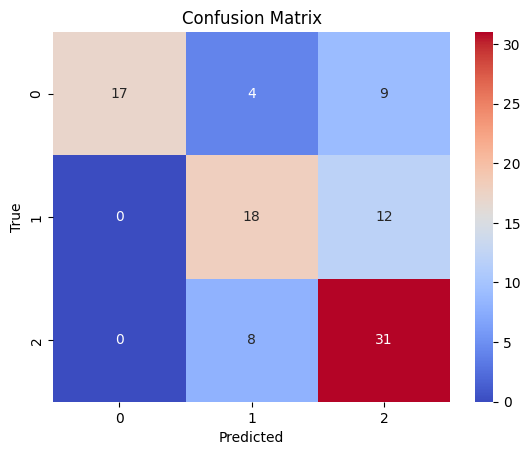

In [ ]:
# Evaluate the model
evaluate_model(model, y_test, X_test)

## Visualizing Results

4/4 [==============================] - 21s 4s/step


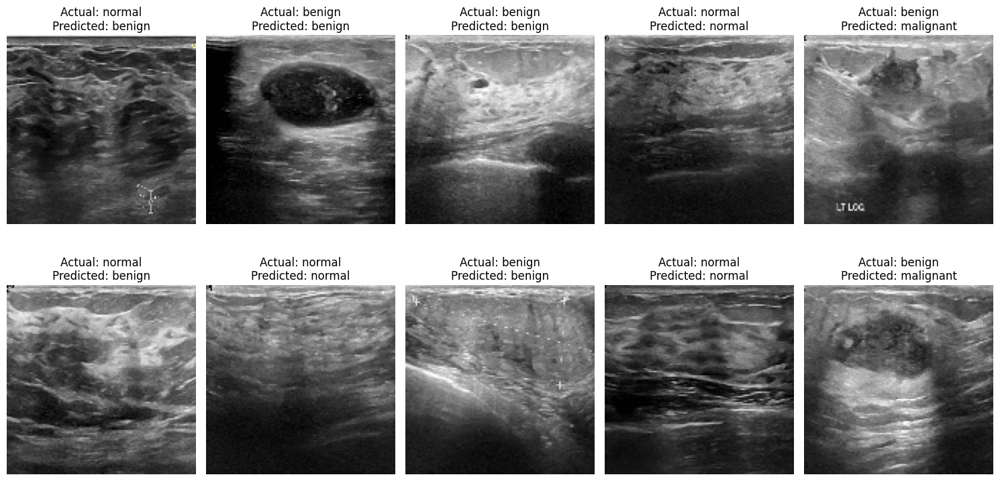

In [ ]:
y_pred = model.predict(np.array(X_test))
y_pred = np.argmax(y_pred, axis=1)

# Convert y_test_total to numpy array
y_test_copy = np.array(y_test_copy)

# Define a list of class labels
class_labels = ['normal', 'malignant', 'benign']

# Create a 5x2 grid of images and plot the images with their actual and predicted labels
fig, axes = plt.subplots(2, 5, figsize=(15, 8))
for i, ax in enumerate(axes.flat):
    # Get a random test image and its label
    idx = np.random.randint(0, len(X_test))
    image = X_test[idx]
    label = class_labels[int(y_test_copy[idx])]
    
    # Get the predicted label
    pred_label = class_labels[int(y_pred[idx])]
    
    # Plot the image and label as the title
    ax.imshow(image)
    ax.set_title('Actual: {}\nPredicted: {}'.format(label, pred_label))
    ax.axis('off')
    
plt.tight_layout()
plt.show()

# Brain Scans Tumor Segmentation

## Reading Data

In [ ]:
train_dir = '/content/Dataset/Brain scans/Tumor/TRAIN'
train_mask_dir = '/content/Dataset/Brain scans/Tumor/TRAIN_masks'
test_dir = '/content/Dataset/Brain scans/Tumor/TEST'
test_mask_dir = '/content/Dataset/Brain scans/Tumor/TEST_masks'

In [ ]:
def read_resize_img(img_path, img_size):
    img = cv2.imread(img_path)
    img = cv2.resize(img, img_size)
    return img

In [ ]:
def load_image(img_dir, mask_dir):
    X = []
    y = []
    for img_name in tqdm(os.listdir(img_dir)):
        img_path = os.path.join(img_dir, img_name)
        mask_path = os.path.join(mask_dir, img_name.replace('.jpg', '.png'))
        img = read_resize_img(img_path, (128,128))[:,:,0]
        mask = read_resize_img(mask_path, (128,128))[:,:,0]
        X.append(img)
        y.append(mask)
    return np.array(X).reshape(-1,128,128,1), np.array(y) / 255

In [ ]:
X_train, y_train = load_image(train_dir, train_mask_dir)
X_test, y_test = load_image(test_dir, test_mask_dir)

100%|██████████| 100/100 [00:00<00:00, 125.28it/s]


## Data Visualization

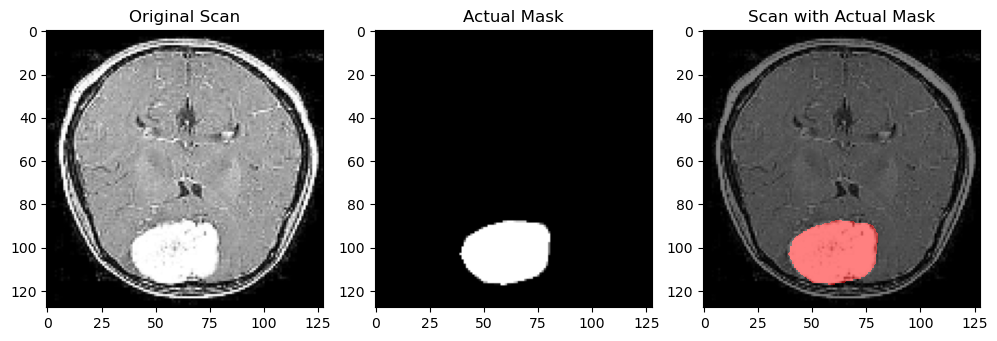

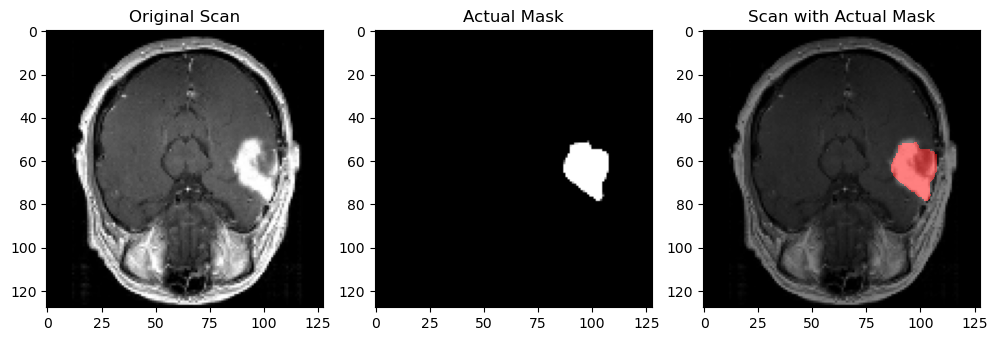

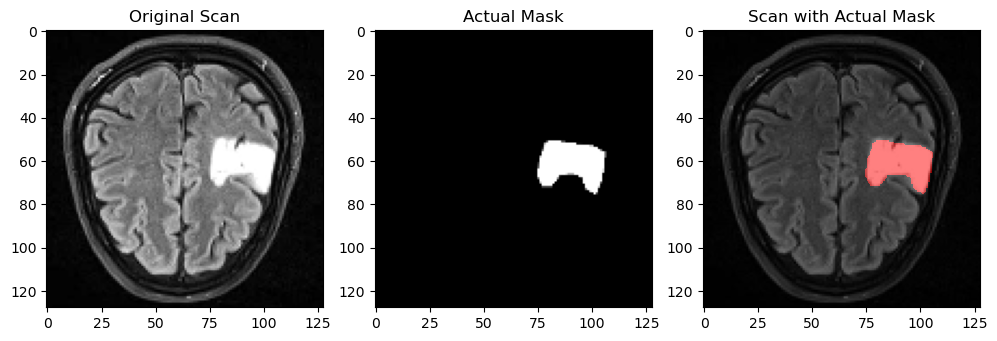

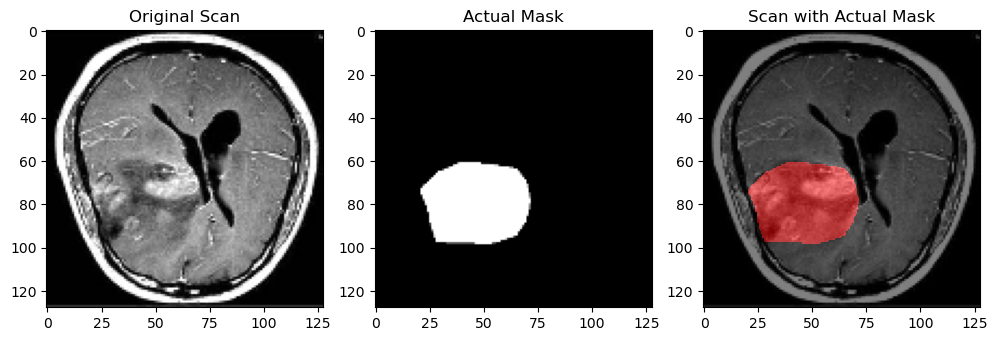

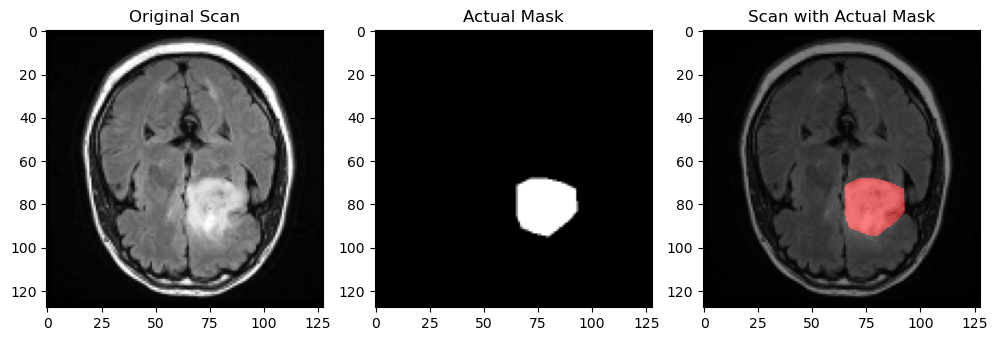

In [ ]:
for i in range(5):
    fig, ax = plt.subplots(1, 3, figsize=(10,8))
    cmap = ListedColormap(['black', 'red'])
    
    ax[0].imshow(X_train[i], cmap='gray')
    ax[0].set_title('Original Scan')
    
    ax[1].imshow(y_train[i], cmap='gray')
    ax[1].set_title("Actual Mask")
    
    
    ax[2].imshow(X_train[i], cmap='gray')
    ax[2].imshow(y_train[i], alpha=0.5, cmap=cmap)
    ax[2].set_title('Scan with Actual Mask')
    
    
    plt.tight_layout()
    plt.show()

## Modelling

In [ ]:
def UNET(input_shape):
    # Define the U-Net model
    inputs = Input(input_shape)

    # Downsample path
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    # Bottleneck
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    drop5 = Dropout(0.5)(conv5)

    # Upsample path
    up6 = UpSampling2D(size=(2, 2))(drop5)
    up6 = Conv2D(512, 2, activation='relu', padding='same')(up6)
    merge6 = concatenate([drop4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)
    drop6 = Dropout(0.5)(conv6)
    up7 = UpSampling2D(size=(2, 2))(drop6)
    up7 = Conv2D(256, 2, activation='relu', padding='same')(up7)
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)
    drop7 = Dropout(0.5)(conv7)
    up8 = UpSampling2D(size=(2, 2))(drop7)
    up8 = Conv2D(128, 2, activation='relu', padding='same')(up8)
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)
    drop8 = Dropout(0.5)(conv8)
    up9 = UpSampling2D(size=(2, 2))(drop8)
    up9 = Conv2D(64, 2, activation='relu', padding='same')(up9)
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)
    conv9 = Conv2D(1, 3, activation='relu', padding='same')(conv9)

    # Output
    output = Conv2D(1, 1, activation='sigmoid')(conv9)

    # Define the model
    model = Model(inputs=inputs, outputs=output)

    return model

In [ ]:
# define function to calculate dice coeffiectint
def dice_coef(y_true, y_pred):
    smooth = 1
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [ ]:
brain_unet_model = UNET(X_train.shape[1:])

In [ ]:
# compile model with Adam optimizer and binary crossentropy as loss function
brain_unet_model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[dice_coef])

In [ ]:
unet_brian_history = brain_unet_model.fit(X_train, y_train, epochs=320, validation_data=(X_test, y_test))

Epoch 1/320


2023-04-14 21:44:53.336994: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_33/dropout_69/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 138s 605ms/step - loss: 0.3376 - dice_coef: 0.0880 - val_loss: 0.3089 - val_dice_coef: 0.1051
Epoch 2/320
16/16 [==============================] - 10s 596ms/step - loss: 0.2337 - dice_coef: 0.1214 - val_loss: 0.2133 - val_dice_coef: 0.1100
Epoch 3/320
16/16 [==============================] - 9s 589ms/step - loss: 0.2153 - dice_coef: 0.1082 - val_loss: 0.2368 - val_dice_coef: 0.1671
Epoch 4/320
16/16 [==============================] - 9s 594ms/step - loss: 0.1799 - dice_coef: 0.1759 - val_loss: 0.1927 - val_dice_coef: 0.1809
Epoch 5/320
16/16 [==============================] - 9s 591ms/step - loss: 0.1556 - dice_coef: 0.2389 - val_loss: 0.2042 - val_dice_coef: 0.2053
Epoch 6/320
16/16 [==============================] - 9s 587ms/step - loss: 0.1509 - dice_coef: 0.2529 - val_loss: 0.1866 - val_dice_coef: 0.2150
Epoch 7/320
16/16 [==============================] - 9s 584ms/step - loss: 0.1280 - dice_coef: 0.3068 - val_loss: 0.1533 - val_dice_coef: 0

In [ ]:
loss, dice = brain_unet_model.evaluate(X_train, y_train, verbose=0)
print("Train Loss =", loss)
print("Train Dice Coef. =", dice)

Train Loss = 0.031063131988048553
Train Dice Coef. = 0.7216014862060547


In [ ]:
loss, dice = brain_unet_model.evaluate(X_test, y_test, verbose=0)
y_pred = brain_unet_model.predict(X_test, verbose=0)
y_pred = np.where(y_pred > 0.5, 1, 0)
precision = Precision()(y_test, y_pred)
recall = Recall()(y_test, y_pred)
# Calculate mean IoU
miou = MeanIoU(num_classes=2)
miou.update_state(y_test, y_pred)
mean_iou = miou.result().numpy()

print("Test Loss =", loss)
print("Test Dice Coef. =", dice)
print("Test Mean IoU: {:.4f}".format(mean_iou))
print("Test Precision: {:.4f}".format(precision))
print("Test Recall: {:.4f}".format(recall))

Test Loss = 0.11243541538715363
Test Dice Coef. = 0.6074899435043335
Test Mean IoU: 0.8336
Test Precision: 0.8354
Test Recall: 0.7926


In [ ]:
brain_unet_model.save('./BRAIN-UNET-320epochs.h5')

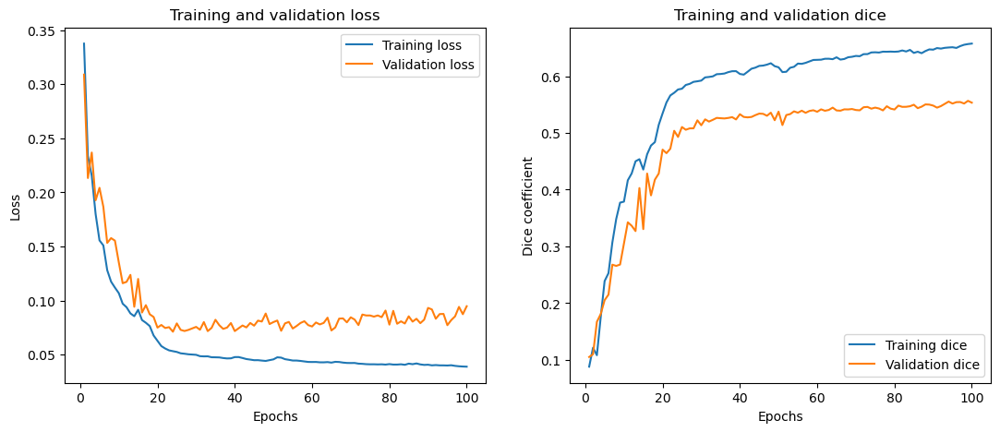

In [ ]:
# Plot the training and validation metrics for the first 100 epochs
train_loss = unet_brian_history.history['loss'][:100]
val_loss = unet_brian_history.history['val_loss'][:100]
train_dice = unet_brian_history.history['dice_coef'][:100]
val_dice = unet_brian_history.history['val_dice_coef'][:100]

epochs = range(1, len(train_loss[:100]) + 1)

plt.figure(figsize=(20, 5))
plt.subplot(1, 3, 1)
plt.plot(epochs, train_loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(epochs, train_dice, label='Training dice')
plt.plot(epochs, val_dice, label='Validation dice')
plt.title('Training and validation dice')
plt.xlabel('Epochs')
plt.ylabel('Dice coefficient')
plt.legend()

plt.show()

## Visualizing Results

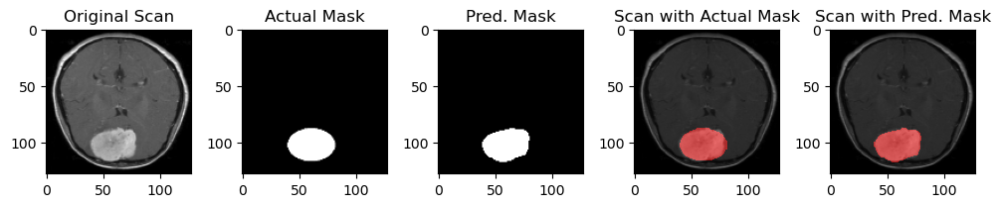

Predicted Tumor width in pixels : 42
Predicted Tumor height in pixels : 30


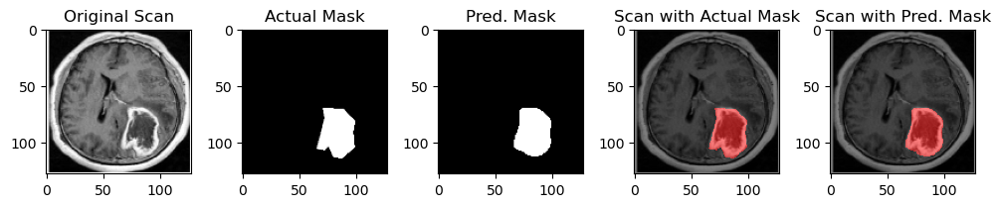

Predicted Tumor width in pixels : 33
Predicted Tumor height in pixels : 43


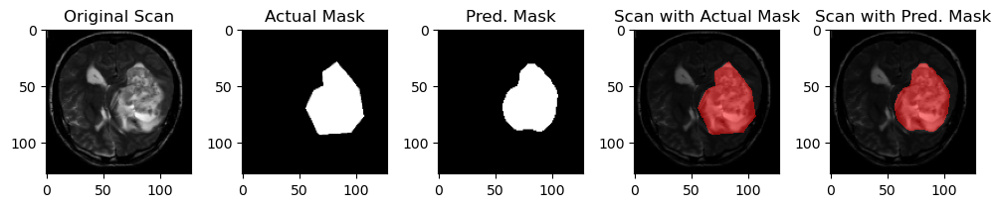

Predicted Tumor width in pixels : 49
Predicted Tumor height in pixels : 60


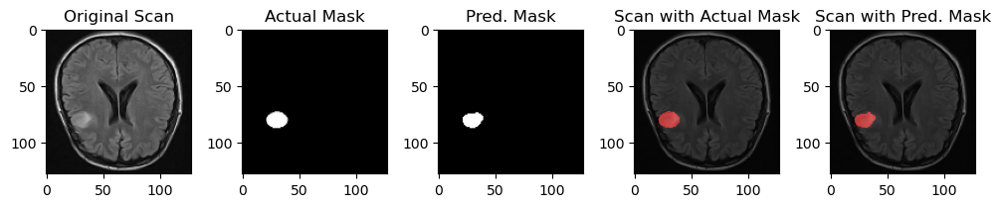

Predicted Tumor width in pixels : 18
Predicted Tumor height in pixels : 14


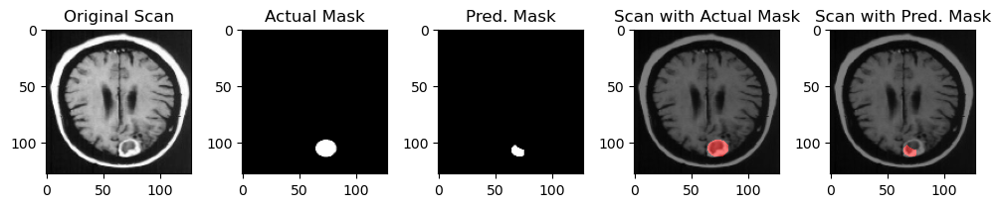

Predicted Tumor width in pixels : 11
Predicted Tumor height in pixels : 10


In [ ]:
idx_list = []
for i in range(5):
    idx = np.random.randint(len(X_test))
    idx_list.append(idx)
    fig, ax = plt.subplots(1, 5, figsize=(10,8))
    mask_pred = np.squeeze(brain_unet_model.predict(np.expand_dims(X_test[idx], axis=0), verbose=0), axis=0)
    mask_pred = np.where(mask_pred > 0.5, 1, 0)
    x, y, w, h = cv2.boundingRect(mask_pred.astype(np.uint8))
    cmap = ListedColormap(['black', 'red'])
    
    ax[0].imshow(X_test[idx], cmap='gray')
    ax[0].set_title('Original Scan')
    
    ax[1].imshow(y_test[idx], cmap='gray')
    ax[1].set_title("Actual Mask")
    
    ax[2].imshow(mask_pred, cmap='gray')
    ax[2].set_title("Pred. Mask")
    
    ax[3].imshow(X_test[idx], cmap='gray')
    ax[3].imshow(y_test[idx], alpha=0.5, cmap=cmap)
    ax[3].set_title('Scan with Actual Mask')
    
    ax[4].imshow(X_test[idx], cmap='gray')
    ax[4].imshow(mask_pred, alpha=0.5, cmap=cmap)
    ax[4].set_title('Scan with Pred. Mask')
    
    plt.tight_layout()
    plt.show()
    print('Predicted Tumor width in pixels : {}'.format(w))
    print('Predicted Tumor height in pixels : {}'.format(h))

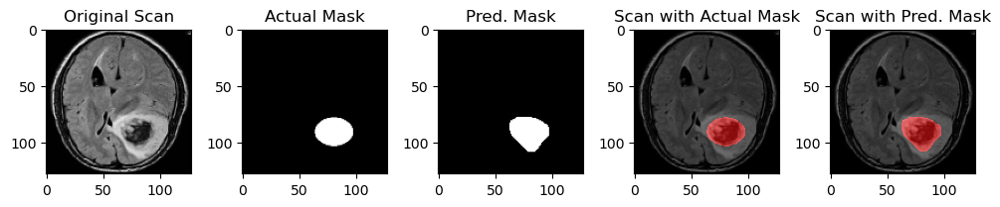

Predicted Tumor width in pixels : 35
Predicted Tumor height in pixels : 31


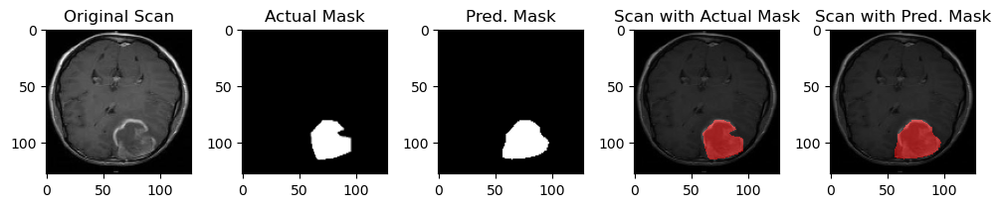

Predicted Tumor width in pixels : 41
Predicted Tumor height in pixels : 35


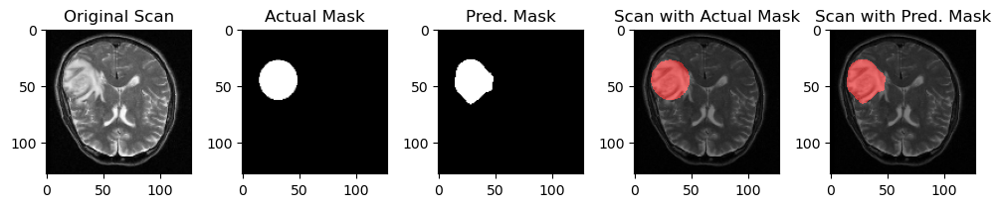

Predicted Tumor width in pixels : 34
Predicted Tumor height in pixels : 40


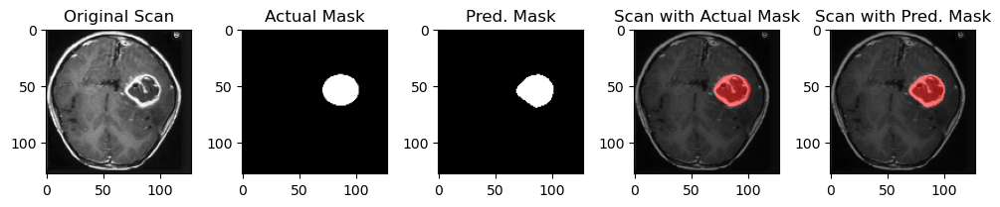

Predicted Tumor width in pixels : 33
Predicted Tumor height in pixels : 30


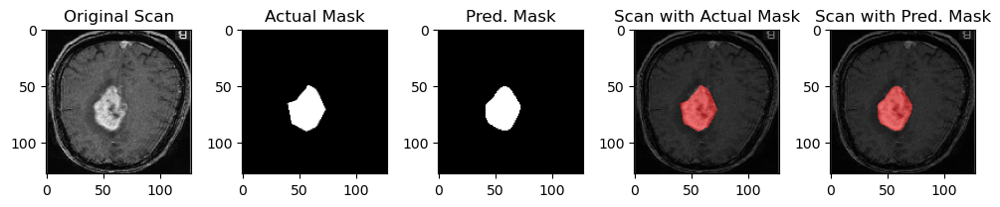

Predicted Tumor width in pixels : 31
Predicted Tumor height in pixels : 39


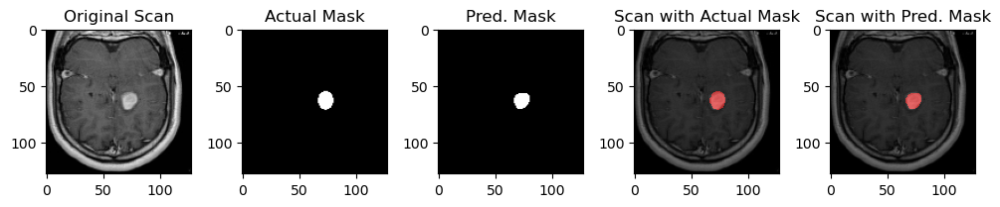

Predicted Tumor width in pixels : 14
Predicted Tumor height in pixels : 14


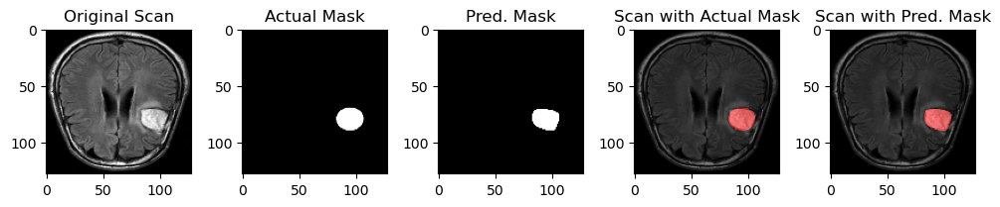

Predicted Tumor width in pixels : 24
Predicted Tumor height in pixels : 19


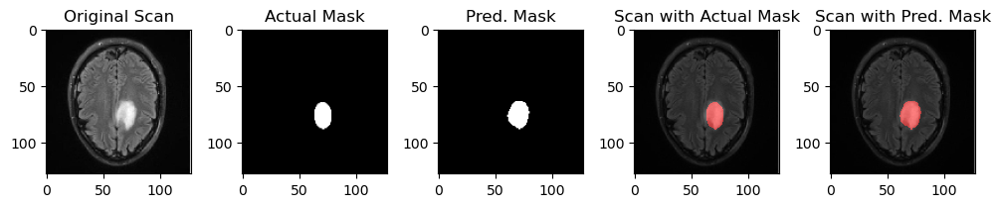

Predicted Tumor width in pixels : 20
Predicted Tumor height in pixels : 25


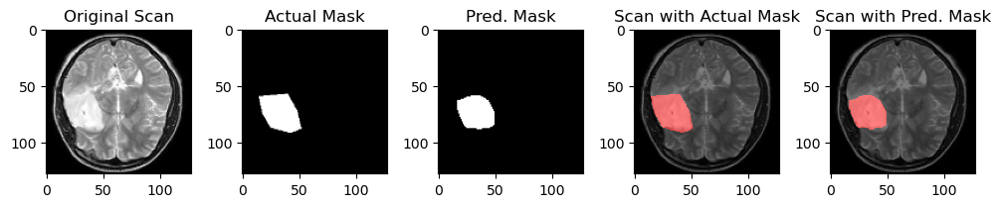

Predicted Tumor width in pixels : 33
Predicted Tumor height in pixels : 30


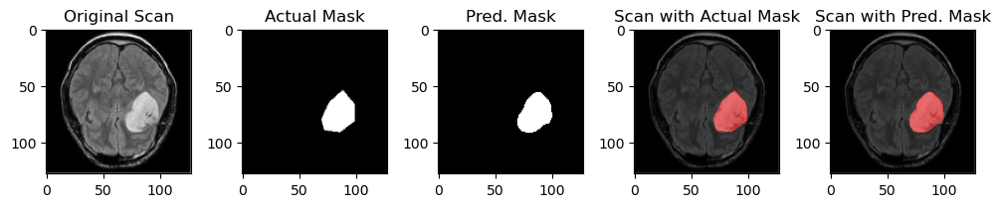

Predicted Tumor width in pixels : 31
Predicted Tumor height in pixels : 36


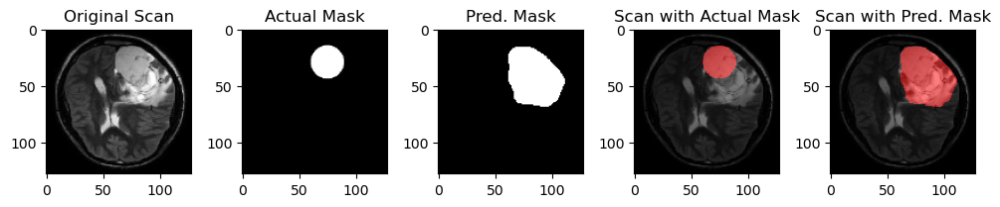

Predicted Tumor width in pixels : 50
Predicted Tumor height in pixels : 53


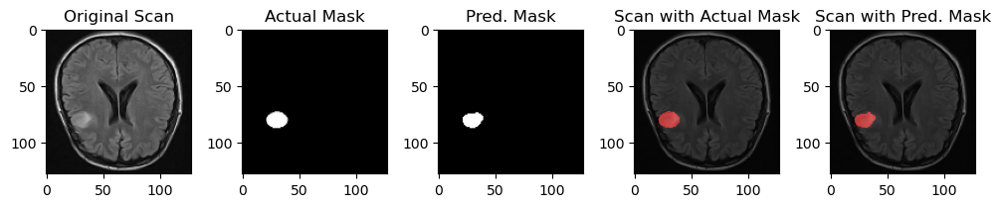

Predicted Tumor width in pixels : 18
Predicted Tumor height in pixels : 14


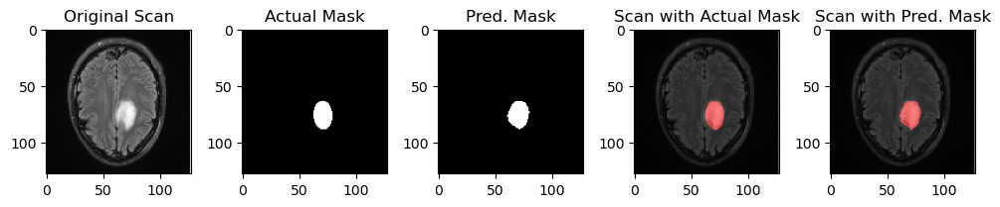

Predicted Tumor width in pixels : 20
Predicted Tumor height in pixels : 25


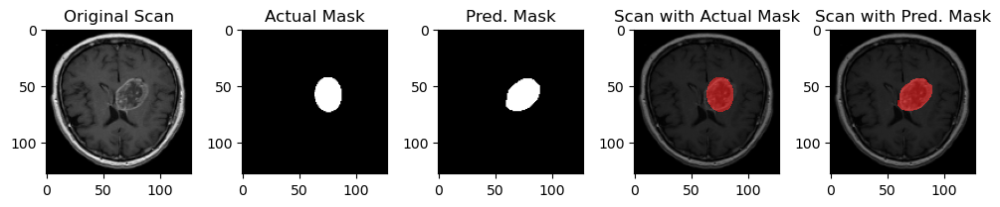

Predicted Tumor width in pixels : 30
Predicted Tumor height in pixels : 29


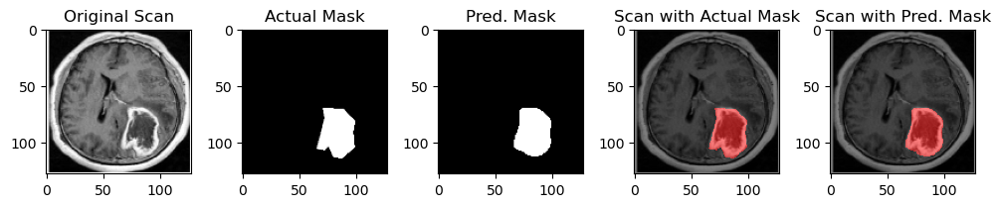

Predicted Tumor width in pixels : 33
Predicted Tumor height in pixels : 43


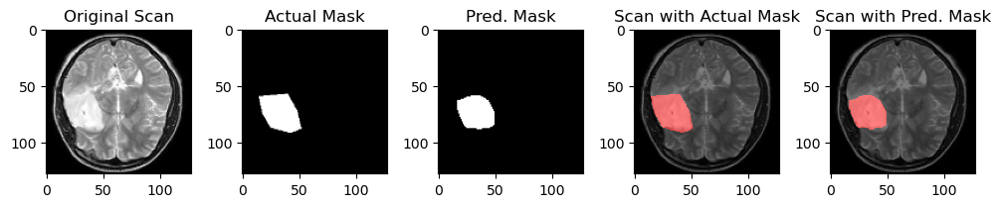

Predicted Tumor width in pixels : 33
Predicted Tumor height in pixels : 30


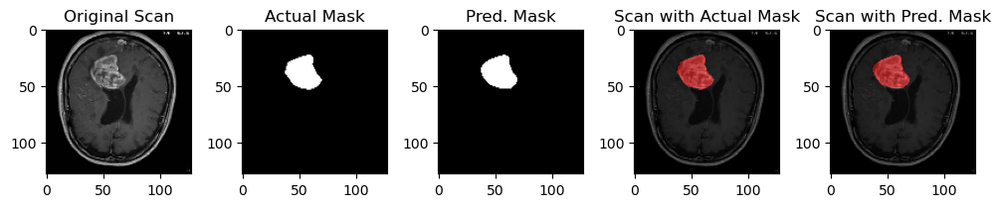

Predicted Tumor width in pixels : 32
Predicted Tumor height in pixels : 30


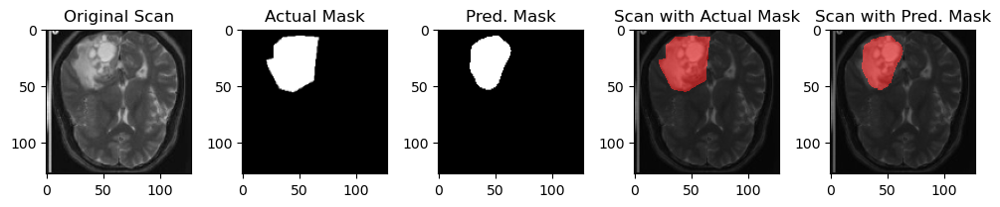

Predicted Tumor width in pixels : 37
Predicted Tumor height in pixels : 48


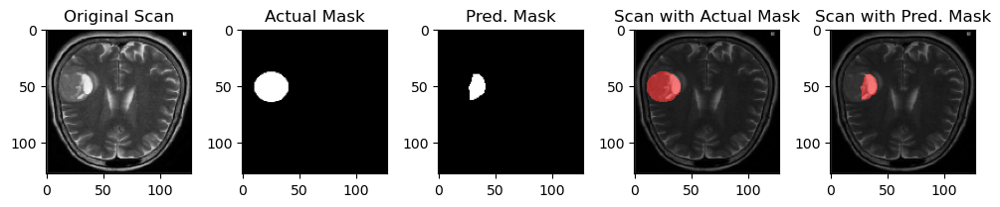

Predicted Tumor width in pixels : 15
Predicted Tumor height in pixels : 23


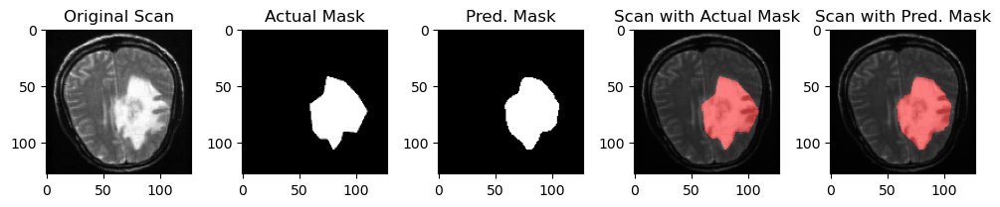

Predicted Tumor width in pixels : 48
Predicted Tumor height in pixels : 64


In [ ]:
idx_list = []
for i in range(20):
    idx = np.random.randint(len(X_test))
    idx_list.append(idx)
    fig, ax = plt.subplots(1, 5, figsize=(10,8))
    mask_pred = np.squeeze(brain_unet_model.predict(np.expand_dims(X_test[idx], axis=0), verbose=0), axis=0)
    mask_pred = np.where(mask_pred > 0.5, 1, 0)
    x, y, w, h = cv2.boundingRect(mask_pred.astype(np.uint8))
    cmap = ListedColormap(['black', 'red'])
    
    ax[0].imshow(X_test[idx], cmap='gray')
    ax[0].set_title('Original Scan')
    
    ax[1].imshow(y_test[idx], cmap='gray')
    ax[1].set_title("Actual Mask")
    
    ax[2].imshow(mask_pred, cmap='gray')
    ax[2].set_title("Pred. Mask")
    
    ax[3].imshow(X_test[idx], cmap='gray')
    ax[3].imshow(y_test[idx], alpha=0.5, cmap=cmap)
    ax[3].set_title('Scan with Actual Mask')
    
    ax[4].imshow(X_test[idx], cmap='gray')
    ax[4].imshow(mask_pred, alpha=0.5, cmap=cmap)
    ax[4].set_title('Scan with Pred. Mask')
    
    plt.tight_layout()
    plt.show()
    print('Predicted Tumor width in pixels : {}'.format(w))
    print('Predicted Tumor height in pixels : {}'.format(h))

# Breast Scans Tumor Segmentation

## Reading Data

In [ ]:
MAIN_DIR = '/content/Dataset/Breast scans'
img_row = 128
img_col = 128
img_chan = 1
Epochs = 200
Batch_size = 32  
input_size = (img_row, img_col, img_chan)

In [ ]:
def Load_data(mainDir ,subset = 'Train'):
  for i in ['benign','malignant']:
    source_folder = f'{mainDir}/{i}/{subset}'
    destination_image_folder = f'images_{subset}'
    destination_mask_folder = f'masks_{subset}'
    if not os.path.exists(destination_image_folder):
        os.makedirs(destination_image_folder)

    if not os.path.exists(destination_mask_folder):
        os.makedirs(destination_mask_folder)

    for root, dirs, files in os.walk(source_folder):
        for file in files:
            if file.endswith('398).png') or file.endswith('398)_mask.png') :
                continue
            else:    
                if file.endswith('.png') and '_mask' not in file:
                    # Copy image to destination folder
                    shutil.copy(os.path.join(root, file), destination_image_folder)
                elif file.endswith('_mask.png'):
                    # Copy mask to destination folder
                    shutil.copy(os.path.join(root, file), destination_mask_folder)
  imagesList = os.listdir(destination_image_folder)
  masksList = os.listdir(destination_mask_folder)
  print(f"Imgae Size:  {len(imagesList)}")
  print(f"Mask Size: {len(masksList)}")


In [ ]:
 #Load the images 
def img_load(dir_path, imgs_list, imgs_array,num_imgs,img_row, img_col, img_chan):
    for i in range(num_imgs):
        tmp_img = image.load_img(os.path.join(dir_path, imgs_list[i]), target_size=(img_row, img_col, img_chan))
        img = image.img_to_array(tmp_img)
        imgs_array[i] = img[:,:,0]/255.0 

    # Expand the dimensions of the arrays
    imgs_array = np.expand_dims(imgs_array, axis=3)
    return imgs_array


def Preprocess(path_imgs,path_masks):
    for filename in os.listdir(path_masks):
        if filename.endswith('_mask.png'):
            new_filename = filename.replace('_mask.png', '.png')
            os.rename(os.path.join(path_masks, filename), os.path.join(path_masks, new_filename))
    imagesList = os.listdir(path_imgs)

    # Sort the images in ascending order
    imgList=natsort.natsorted(imagesList)

    # Introduce parameters
    img_row = 128
    img_col = 128
    img_chan = 1
    Epochs = 200
    Batch_size = 32 
    input_size = (img_row, img_col, img_chan)

    num_imgs = len(imgList)
    print("Number of images:", num_imgs)

    # Initialize the arrays
    imgs = np.zeros((num_imgs, img_row, img_col))
    masks = np.zeros_like(imgs)

    imgs = img_load(path_imgs, imgList, imgs,num_imgs,img_row, img_col, img_chan)
    masks = img_load(path_masks, imgList, masks,num_imgs,img_row, img_col, img_chan)

    print("Images", imgs.shape)
    print("Masks", masks.shape) 
    return    imgs, masks    

In [ ]:
Load_data(MAIN_DIR ,subset = 'Train')

Imgae Size:  577
Mask Size: 577


In [ ]:
Load_data(MAIN_DIR ,subset = 'Test')

Imgae Size:  69
Mask Size: 69


In [ ]:
path_images_train = '/content/images_Train'
path_masks_train = '/content/masks_Train'
imgs_train,masks_train = Preprocess(path_images_train,path_masks_train)

Number of images: 577
Images (577, 128, 128, 1)
Masks (577, 128, 128, 1)


In [ ]:
path_images_test = '/content/images_Test'
path_masks_test = '/content/masks_Test'
imgs_test,masks_test = Preprocess(path_images_test,path_masks_test)

Number of images: 69
Images (69, 128, 128, 1)
Masks (69, 128, 128, 1)


In [ ]:
# Train-Test Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = imgs_train,imgs_test,masks_train,masks_test
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(577, 128, 128, 1)
(577, 128, 128, 1)
(69, 128, 128, 1)
(69, 128, 128, 1)


## Data Visualization

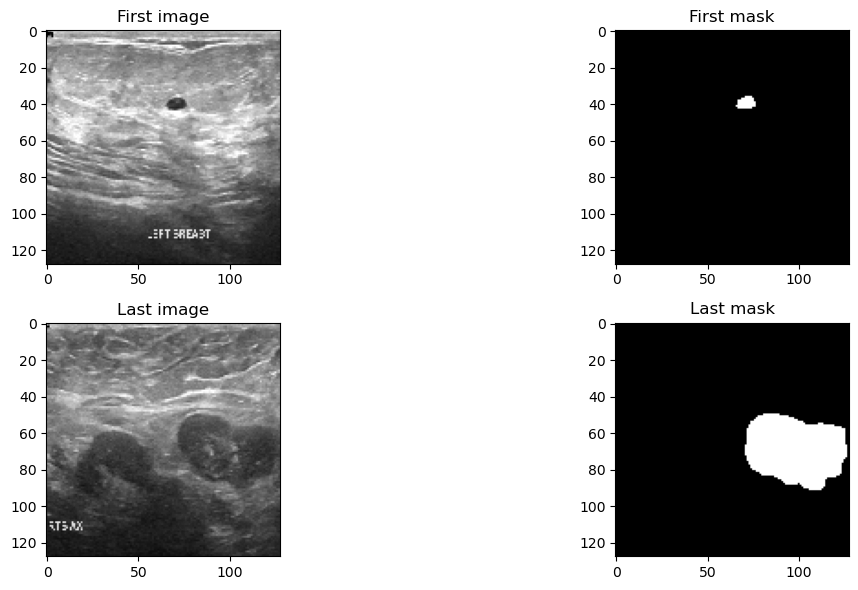

In [ ]:
#Plot the first and last images
plt.figure(figsize = (14,6))
plt.subplot(221)
plt.imshow(np.squeeze(imgs_train[0]), cmap = "gray")
plt.title('First image')
plt.subplot(222)
plt.imshow(np.squeeze(masks_train[0]), cmap = "gray")
plt.title('First mask')
plt.subplot(223)
plt.imshow(np.squeeze(imgs_train[-1]), cmap = "gray")
plt.title('Last image')
plt.subplot(224)
plt.imshow(np.squeeze(masks_train[-1]), cmap = "gray")
plt.title('Last mask')
plt.tight_layout()
plt.show()

## Modelling

In [ ]:
def plot_metrics(loss, val_loss, accuracy, val_accuracy, iou, val_iou, dice_coef, val_dice_coef,):
    fig = plt.figure(figsize=(20, 8))

    ax1 = fig.add_subplot(1, 4, 1)
    ax1.set_title("Model Loss")
    ax1.plot(loss, label="Training")
    ax1.plot(val_loss, label="Validation")
    ax1.legend()
    ax1.grid()

    ax2 = fig.add_subplot(1, 4, 2)
    ax2.set_title("Model Accuracy")
    ax2.plot(accuracy, label="Training")
    ax2.plot(val_accuracy, label="Validation")
    ax2.legend()
    ax2.grid()
    ax3 = fig.add_subplot(1, 4, 3)
    ax3.set_title("Model Dice_coef")
    ax3.plot(dice_coef, label="Training")
    ax3.plot(val_dice_coef, label="Validation")
    ax3.legend()
    ax3.grid()

    ax4 = fig.add_subplot(1, 4, 4)
    ax4.set_title("Model IoU")
    ax4.plot(iou, label="Training")
    ax4.plot(val_iou, label="Validation")
    ax4.legend()
    ax4.grid()

    plt.show()


In [ ]:
def plot_results(random_x,X_test, y_test, y_pred, num_images=5, threshold=0.25):
    plt.figure(figsize = (20,20))

    # Select random x numbers to plot


    # Plot the images
    for i, x in enumerate(random_x):

        plt.subplot(num_images, 4, (i*4)+1)
        plt.imshow(X_test[x], 'gray')
        plt.title(f'Real medic Image {i}')
        plt.axis('off')

        plt.subplot(num_images, 4, (i*4)+2)
        plt.imshow(y_test[x], 'gray')
        plt.title(f'Ground Truth Img {i}')
        plt.axis('off')

        plt.subplot(num_images, 4, (i*4)+3)
        plt.imshow(y_pred[x], 'gray')
        plt.title(f'Predicted Image {i}')
        plt.axis('off')

        # Apply threshold
        img = (y_pred[x]>threshold).astype('float')
        plt.subplot(num_images, 4, (i*4)+4)
        plt.imshow(img, 'gray')
        plt.title(f'Thresholded Image {i}')
        plt.axis('off')
    plt.show()
    for i, x in enumerate(random_x):
        x, y, w, h = cv2.boundingRect((y_pred[x]>threshold).astype(np.uint8))
        print(f' {i} Predicted Tumor width in pixels : {w}')
        print(f' {i} Predicted Tumor height in pixels : {h}')
        print("*"*50)

In [ ]:
# Performance metrics: Dice score coefficient, IOU, recall, sensitivity
def auc(y_true, y_pred):
    y_pred_pos = np.round(np.clip(y_pred, 0, 1))
    y_pred_neg = 1 - y_pred_pos
    y_pos = np.round(np.clip(y_true, 0, 1)) # ground truth
    y_neg = 1 - y_pos
    tp = np.sum(y_pos * y_pred_pos)
    tn = np.sum(y_neg * y_pred_neg)
    fp = np.sum(y_neg * y_pred_pos)
    fn = np.sum(y_pos * y_pred_neg)
    tpr = (tp + K.epsilon()) / (tp + fn + K.epsilon()) #recall
    tnr = (tn + K.epsilon()) / (tn + fp + K.epsilon())
    prec = (tp + K.epsilon()) / (tp + fp + K.epsilon()) #precision
    iou = (tp + K.epsilon()) / (tp + fn + fp + K.epsilon()) #intersection over union
    dsc = (2*tp + K.epsilon()) / (2*tp + fn + fp + K.epsilon()) #dice score
    return [dsc, iou, tpr, prec]

In [ ]:
inply = Input(input_size)

conv1 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(inply)
conv1 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conv1)
pool1 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv1)
drop1 = Dropout(0.2)(pool1)

conv2 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(drop1)
conv2 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conv2)
pool2 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv2)
drop2 = Dropout(0.5)(pool2)

conv3 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(drop2)
conv3 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conv3)
pool3 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv3)
drop3 = Dropout(0.5)(pool3)

conv4 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(drop3)
conv4 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conv4)
pool4 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv4)
drop4 = Dropout(0.5)(pool4)
convm = Conv2D(2**10, (3,3), activation = 'relu', padding = 'same')(drop4)
convm = Conv2D(2**10, (3,3), activation = 'relu', padding = 'same')(convm)
tran5 = Conv2DTranspose(2**9, (2,2), strides = 2, padding = 'valid', activation = 'relu')(convm)
conc5 = Concatenate()([tran5, conv4])
conv5 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conc5)
conv5 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conv5)
drop5 = Dropout(0.5)(conv5)

tran6 = Conv2DTranspose(2**8, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop5)
conc6 = Concatenate()([tran6, conv3])
conv6 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conc6)
conv6 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conv6)
drop6 = Dropout(0.5)(conv6)

tran7 = Conv2DTranspose(2**7, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop6)
conc7 = Concatenate()([tran7, conv2])
conv7 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conc7)
conv7 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conv7)
drop7 = Dropout(0.5)(conv7)

tran8 = Conv2DTranspose(2**6, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop7)
conc8 = Concatenate()([tran8, conv1])
conv8 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conc8)
conv8 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conv8)
# drop8 = Dropout(0.)(conv8)


outly = Conv2D(2**0, (1,1), activation = 'sigmoid', padding = 'same')(conv8)
model = Model(inputs = inply, outputs = outly, name = 'U-net')

In [ ]:
def dice_coef(y_true, y_pred):
    smooth = 1
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [ ]:
model.compile(
    loss='binary_crossentropy',
    optimizer=keras.optimizers.Adam(learning_rate = 0.0005),
    metrics=['accuracy',dice_coef, MeanIoU(num_classes=2, name='IoU')]
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
earlystopper = EarlyStopping(patience=30, verbose=1)
checkpointer = ModelCheckpoint('Unetsigmoid_try.h5', verbose=1, save_best_only=True)

history = model.fit(X_train, y_train, epochs = Epochs, batch_size = Batch_size, validation_data = (X_test, y_test), callbacks = [checkpointer,earlystopper])

Epoch 1/200


2023-04-15 11:44:24.077309: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inU-net/dropout_79/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


18/19 [===========================>..] - ETA: 0s - loss: 0.1844 - accuracy: 0.9322 - dice_coef: 0.3935 - IoU: 0.4564
Epoch 1: val_loss improved from inf to 0.26526, saving model to Unetsigmoid_try.h5
19/19 [==============================] - 13s 312ms/step - loss: 0.1845 - accuracy: 0.9322 - dice_coef: 0.3785 - IoU: 0.4564 - val_loss: 0.2653 - val_accuracy: 0.8818 - val_dice_coef: 0.4056 - val_IoU: 0.4295
Epoch 2/200
18/19 [===========================>..] - ETA: 0s - loss: 0.1698 - accuracy: 0.9364 - dice_coef: 0.4224 - IoU: 0.4564
Epoch 2: val_loss did not improve from 0.26526
19/19 [==============================] - 4s 225ms/step - loss: 0.1696 - accuracy: 0.9365 - dice_coef: 0.4307 - IoU: 0.4564 - val_loss: 0.2683 - val_accuracy: 0.8812 - val_dice_coef: 0.4062 - val_IoU: 0.4295
Epoch 3/200
18/19 [===========================>..] - ETA: 0s - loss: 0.1642 - accuracy: 0.9379 - dice_coef: 0.4417 - IoU: 0.4567
Epoch 3: val_loss improved from 0.26526 to 0.25355, saving model to Unetsigmoid_

3/3 [==============================] - 0s 59ms/step


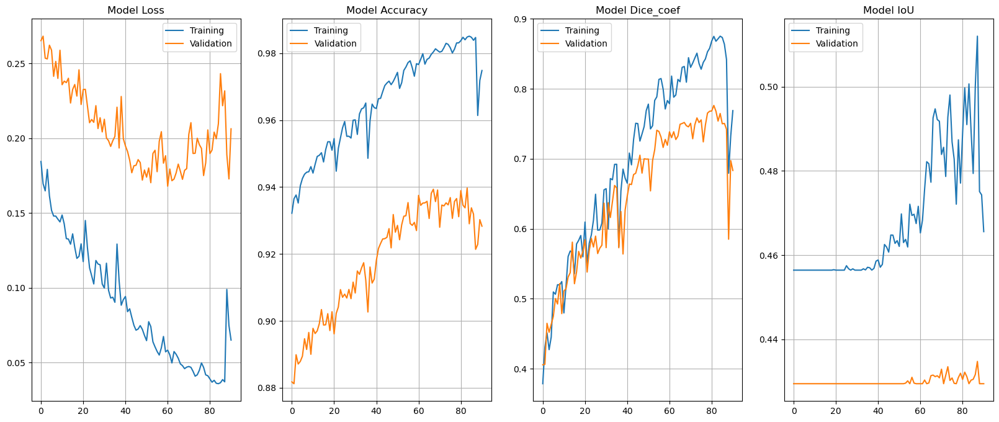

In [ ]:
y_pred = model.predict(X_test)
loss, accuracy,dice_coef, iou,  val_loss, val_accuracy,val_dice_coef, val_iou = history.history.values()
plot_metrics(loss, val_loss, accuracy, val_accuracy, iou, val_iou,dice_coef,val_dice_coef)    

In [ ]:
dsc, iou, tpr, prec = auc(y_test, y_pred)
print('\n Dice coefficient: \t\t{0:^.3f} \n IoU \t\t\t\t{1:^.3f} \n Recall \t\t\t{2:^.3f} \n Precision\t\t\t{3:^.3f}'.format(
           dsc, iou, tpr, prec ))


 Dice coefficient: 		0.768 
 IoU 				0.624 
 Recall 			0.734 
 Precision			0.806


## Visualizing Results

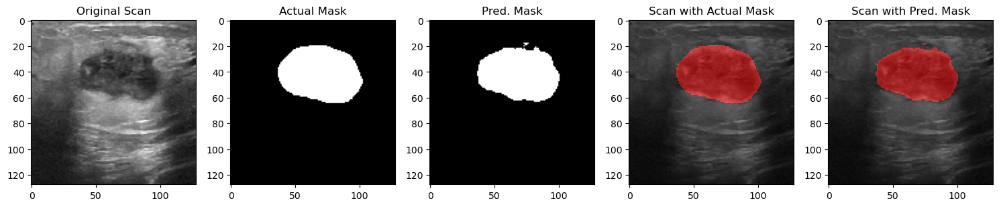

Predicted Tumor width in pixels : 64
Predicted Tumor height in pixels : 46


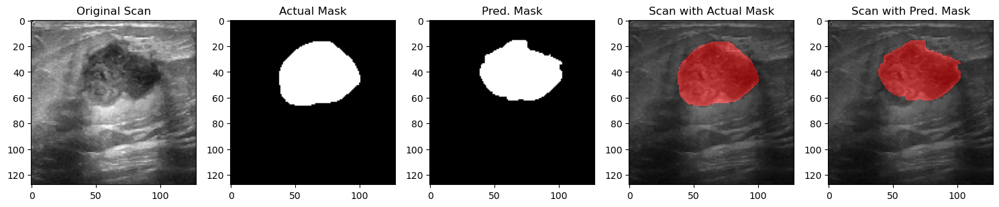

Predicted Tumor width in pixels : 64
Predicted Tumor height in pixels : 47


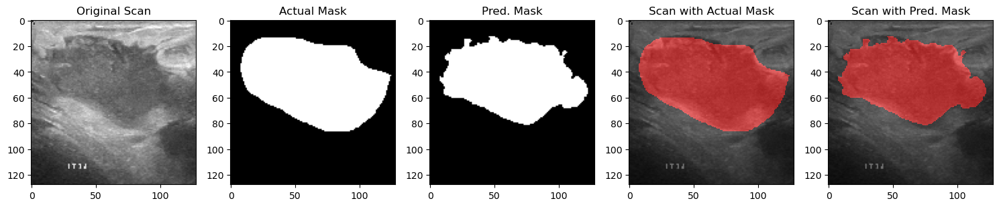

Predicted Tumor width in pixels : 115
Predicted Tumor height in pixels : 69


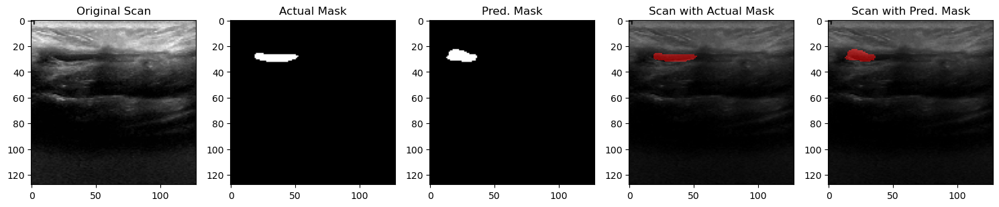

Predicted Tumor width in pixels : 24
Predicted Tumor height in pixels : 10


In [ ]:
random_x = random.sample(range(len(X_test)), 5)
for i in random_x:
    fig, ax = plt.subplots(1, 5, figsize=(15,8))
    mask_pred = np.squeeze(model.predict(np.expand_dims(X_test[i], axis=0), verbose=0), axis=0)
    mask_pred = np.where(mask_pred > 0.5, 1, 0)
    x, y, w, h = cv2.boundingRect(mask_pred.astype(np.uint8))
    cmap = ListedColormap(['black', 'red'])
    
    ax[0].imshow(X_test[i], cmap='gray')
    ax[0].set_title('Original Scan')
    
    ax[1].imshow(y_test[i], cmap='gray')
    ax[1].set_title("Actual Mask")
    
    ax[2].imshow(mask_pred, cmap='gray')
    ax[2].set_title("Pred. Mask")
    
    ax[3].imshow(X_test[i], cmap='gray')
    ax[3].imshow(y_test[i], alpha=0.5, cmap=cmap)
    ax[3].set_title('Scan with Actual Mask')
    
    ax[4].imshow(X_test[i], cmap='gray')
    ax[4].imshow(mask_pred, alpha=0.5, cmap=cmap)
    ax[4].set_title('Scan with Pred. Mask')
    
    plt.tight_layout()
    plt.show()
    print('Predicted Tumor width in pixels : {}'.format(w))
    print('Predicted Tumor height in pixels : {}'.format(h))

# System Simulation

In this section we will do a simulation of what the overall system should behave like

In [ ]:
# load model
brain_breast_classifier = keras.models.load_model('/content/drive/MyDrive/CV Project Models/Brain_Breast_Classifier.h5')
brain_tumor_classifier = keras.models.load_model('/content/drive/MyDrive/CV Project Models/brain_classifier.h5')
breast_tumor_classifier = keras.models.load_model('/content/drive/MyDrive/CV Project Models/Breast_cancer_classification_model.h5')
brain_unet = keras.models.load_model('/content/drive/MyDrive/CV Project Models/BRAIN-UNET-320epochs.h5', 
                                     custom_objects={'dice_coef': dice_coef})

breast_unet = keras.models.load_model('/content/drive/MyDrive/CV Project Models/breast_cancer_unet_model.h5', 
                                     custom_objects={'dice_coef': dice_coef})

## Brain Scans Simulation

******************** Brain/Breast Classifier Output ********************
Actual: Brain Scan
Predicted: Brain Scan
******************** Brain Tumor/No Tumor Classifier Output ********************
Actual: Tumor
Predicted: Tumor


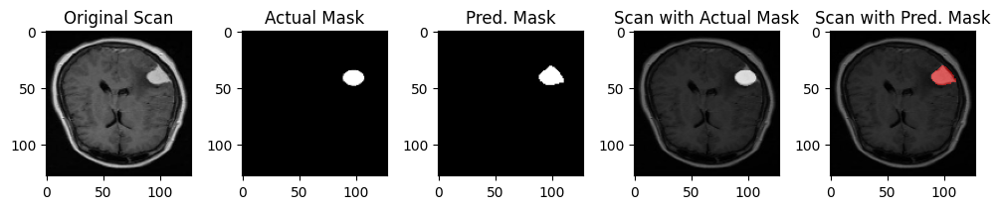

Predicted Tumor width in pixels : 22
Predicted Tumor height in pixels : 17


In [ ]:
# for the purpose of demonstration we will pick a brain tumor scan to test the model
scan_type_classes = ['Brain Scan', 'Breast Scan']
tumor_results_classes = ['No Tumor', 'Tumor']
brain_scan = cv2.imread('/content/Dataset/Brain scans/Tumor/TEST/y710.jpg')
actual_mask = cv2.imread('/content/Dataset/Brain scans/Tumor/TEST_masks/y710.png')
brain_scan = cv2.resize(brain_scan, (128,128))
actual_mask = cv2.resize(actual_mask, (128,128))





scan_type = brain_breast_classifier.predict(brain_scan.reshape(-1,128,128,3), verbose=0)
print(f'*'*20, "Brain/Breast Classifier Output", '*'*20)
print('Actual: Brain Scan')
print(f'Predicted: {scan_type_classes[int(scan_type)]}')


tumor_result = brain_tumor_classifier.predict(brain_scan.reshape(-1,128,128,3), verbose=0)
print(f'*'*20, "Brain Tumor/No Tumor Classifier Output", '*'*20)
print('Actual: Tumor')
print(f'Predicted: {tumor_results_classes[int(tumor_result)]}')


brain_scan_gray_channel = brain_scan[:,:,0].reshape(128,128,1)
mask_pred = np.squeeze(brain_unet.predict(np.expand_dims(brain_scan_gray_channel, axis=0), verbose=0), axis=0)
mask_pred = np.where(mask_pred > 0.5, 1, 0)


fig, ax = plt.subplots(1, 5, figsize=(10,8))
x, y, w, h = cv2.boundingRect(mask_pred.astype(np.uint8))
cmap = ListedColormap(['black', 'red'])

ax[0].imshow(brain_scan, cmap='gray')
ax[0].set_title('Original Scan')

ax[1].imshow(actual_mask, cmap='gray')
ax[1].set_title("Actual Mask")

ax[2].imshow(mask_pred.reshape(128,128), cmap='gray')
ax[2].set_title("Pred. Mask")

ax[3].imshow(brain_scan, cmap='gray')
ax[3].imshow(actual_mask, alpha=0.5, cmap=cmap)
ax[3].set_title('Scan with Actual Mask')

ax[4].imshow(brain_scan, cmap='gray')
ax[4].imshow(mask_pred.reshape(128,128), alpha=0.5, cmap=cmap)
ax[4].set_title('Scan with Pred. Mask')

plt.tight_layout()
plt.show()
print('Predicted Tumor width in pixels : {}'.format(w))
print('Predicted Tumor height in pixels : {}'.format(h))

## Breast Scans Simulation

******************** Brain/Breast Classifier Output ********************
Actual: Breast Scan
Predicted: Breast Scan
******************** Breast Tumor Classifier Output ********************
Actual: Benign
Predicted: Malignant


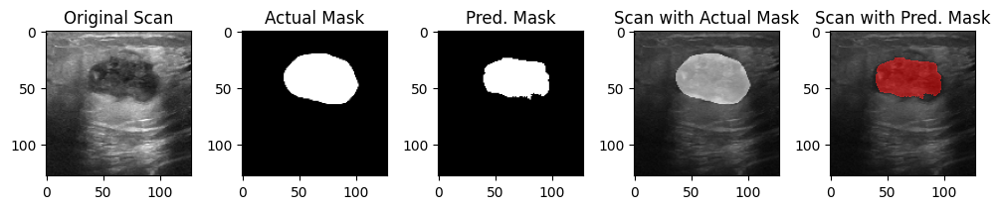

Predicted Tumor width in pixels : 58
Predicted Tumor height in pixels : 37


In [ ]:
# for the purpose of demonstration we will pick a brain tumor scan to test the model
scan_type_classes = ['Brain Scan', 'Breast Scan']
tumor_results_classes = ['Normal', 'Malignant', 'Benign']
breast_scan = cv2.imread('/content/Dataset/Breast scans/benign/Test/benign (399).png')
actual_mask = cv2.imread('/content/Dataset/Breast scans/benign/Test/benign (399)_mask.png')
breast_scan = cv2.resize(breast_scan, (128,128))
actual_mask = cv2.resize(actual_mask, (128,128))





scan_type = brain_breast_classifier.predict(breast_scan.reshape(-1,128,128,3), verbose=0)
print(f'*'*20, "Brain/Breast Classifier Output", '*'*20)
print('Actual: Breast Scan')
print(f'Predicted: {scan_type_classes[int(scan_type)]}')


tumor_result = brain_tumor_classifier.predict(breast_scan.reshape(-1,128,128,3), verbose=0)
print(f'*'*20, "Breast Tumor Classifier Output", '*'*20)
print('Actual: Benign')
print(f'Predicted: {tumor_results_classes[int(tumor_result)]}')


brain_scan_gray_channel = breast_scan[:,:,0].reshape(128,128,1)
mask_pred = np.squeeze(breast_unet.predict(np.expand_dims(brain_scan_gray_channel, axis=0), verbose=0), axis=0)
mask_pred = np.where(mask_pred > 0.5, 1, 0)


fig, ax = plt.subplots(1, 5, figsize=(10,8))
x, y, w, h = cv2.boundingRect(mask_pred.astype(np.uint8))
cmap = ListedColormap(['black', 'red'])

ax[0].imshow(breast_scan[:,:, 0].reshape(128,128,1), cmap='gray')
ax[0].set_title('Original Scan')

ax[1].imshow(actual_mask, cmap='gray')
ax[1].set_title("Actual Mask")

ax[2].imshow(mask_pred, cmap='gray')
ax[2].set_title("Pred. Mask")

ax[3].imshow(breast_scan[:,:, 0].reshape(128,128,1), cmap='gray')
ax[3].imshow(actual_mask, alpha=0.5, cmap=cmap)
ax[3].set_title('Scan with Actual Mask')

ax[4].imshow(breast_scan[:,:, 0].reshape(128,128,1), cmap='gray')
ax[4].imshow(mask_pred, alpha=0.5, cmap=cmap)
ax[4].set_title('Scan with Pred. Mask')

plt.tight_layout()
plt.show()
print('Predicted Tumor width in pixels : {}'.format(w))
print('Predicted Tumor height in pixels : {}'.format(h))